In [18]:
import os
import matplotlib.pyplot as plt
import json
import numpy as np
from sklearn.decomposition import PCA
import pickle

import sys
sys.path.insert(0, '../')
from forest3D import lidar_IO,treeDetector,ground_removal,utilities,detection_tools
from forest3D.pcd import read_pcd
from forest3D import detection_tools,processLidar
from forest3D import lidar_IO,treeDetector,ground_removal,utilities,detection_tools
from forest3D.object_detectors import detectObjects_yolov3 as detectObjects
import matplotlib.pyplot as plt
from pathlib import Path
import glob
#creating a new directory called pythondirectory


# Utils

In [5]:
def make_folder_if_not_exists(path):
    Path(path).mkdir(parents=True, exist_ok=True)

# 3d to 2d slices

1. Converting 3d image to 2d slices.

In [8]:
# Global Vars
offset = [0,0,0]
box_store = np.zeros((1, 4))
counter = 0
windowSize = [50,50]
stepSize = 40
grid_size = [600, 600, 1000]
grid_res = 0.1



# Setting config
config_dict = {"doHisteq": [False, True], "raster_layers": ["vertical_density", "canopy_height"], "gridSize": grid_size, "res": grid_res, "support_window": [11, 7, 1], "normalisation": "rescale+histeq"}
rasterMaker = treeDetector.RasterDetector(**config_dict)



         

0 out of 117 tiles(600, 600, 3)


NameError: name 'raster_stack' is not defined

Reading File:  200_2-060_2_slam.pcd  From Path:  ../../data/pcd_files/
2 out of 110 tiles(600, 600, 3)


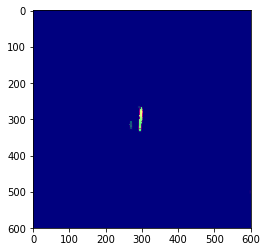

Image saved at:  200_2-060_2_slam slice_no_2.jpeg
3 out of 110 tiles(600, 600, 3)


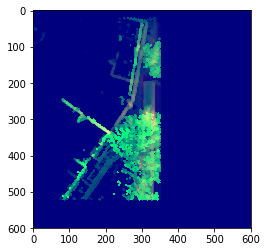

Image saved at:  200_2-060_2_slam slice_no_3.jpeg
4 out of 110 tiles(600, 600, 3)


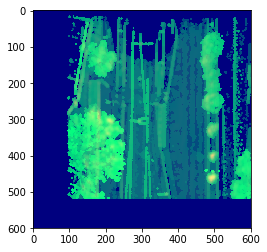

Image saved at:  200_2-060_2_slam slice_no_4.jpeg
5 out of 110 tiles(600, 600, 3)


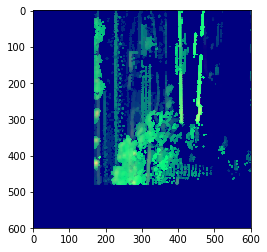

Image saved at:  200_2-060_2_slam slice_no_5.jpeg
6 out of 110 tiles(600, 600, 3)


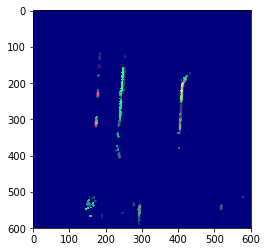

Image saved at:  200_2-060_2_slam slice_no_6.jpeg
7 out of 110 tiles(600, 600, 3)


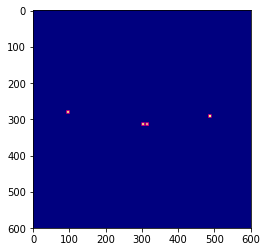

Image saved at:  200_2-060_2_slam slice_no_7.jpeg
8 out of 110 tiles(600, 600, 3)


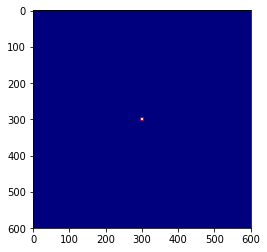

Image saved at:  200_2-060_2_slam slice_no_8.jpeg
13 out of 110 tiles(600, 600, 3)


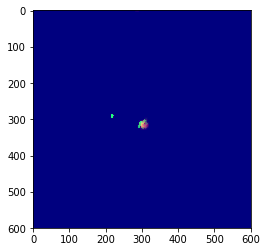

Image saved at:  200_2-060_2_slam slice_no_13.jpeg
14 out of 110 tiles(600, 600, 3)


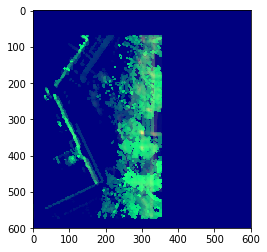

Image saved at:  200_2-060_2_slam slice_no_14.jpeg
15 out of 110 tiles(600, 600, 3)


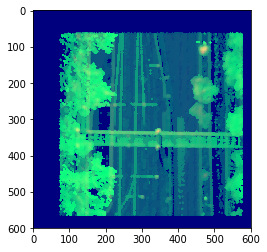

Image saved at:  200_2-060_2_slam slice_no_15.jpeg
16 out of 110 tiles(600, 600, 3)


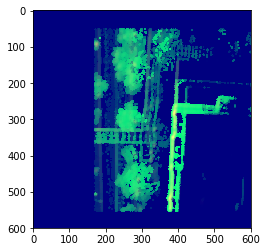

Image saved at:  200_2-060_2_slam slice_no_16.jpeg
17 out of 110 tiles(600, 600, 3)


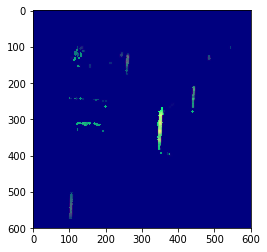

Image saved at:  200_2-060_2_slam slice_no_17.jpeg
18 out of 110 tiles(600, 600, 3)


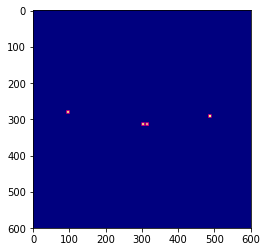

Image saved at:  200_2-060_2_slam slice_no_18.jpeg
19 out of 110 tiles(600, 600, 3)


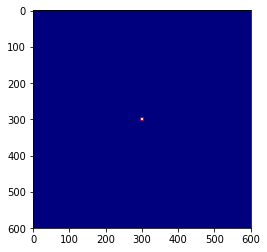

Image saved at:  200_2-060_2_slam slice_no_19.jpeg
20 out of 110 tiles(600, 600, 3)


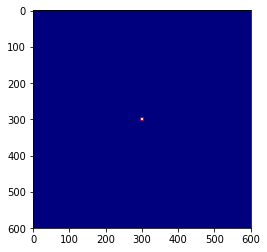

Image saved at:  200_2-060_2_slam slice_no_20.jpeg
23 out of 110 tiles(600, 600, 3)


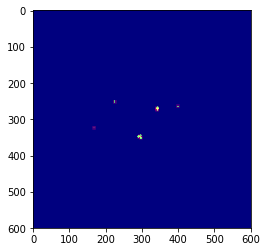

Image saved at:  200_2-060_2_slam slice_no_23.jpeg
24 out of 110 tiles(600, 600, 3)


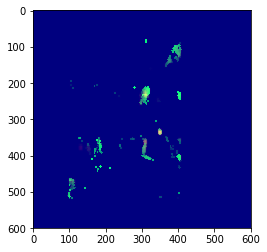

Image saved at:  200_2-060_2_slam slice_no_24.jpeg
25 out of 110 tiles(600, 600, 3)


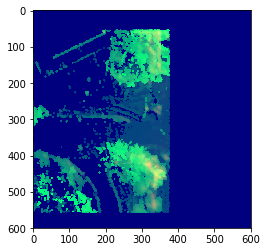

Image saved at:  200_2-060_2_slam slice_no_25.jpeg
26 out of 110 tiles(600, 600, 3)


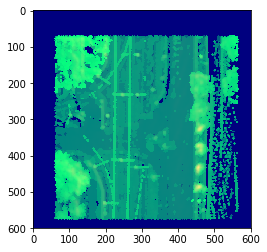

Image saved at:  200_2-060_2_slam slice_no_26.jpeg
27 out of 110 tiles(600, 600, 3)


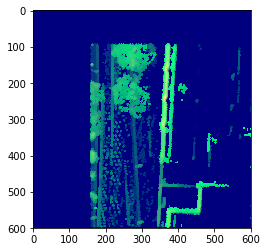

Image saved at:  200_2-060_2_slam slice_no_27.jpeg
28 out of 110 tiles(600, 600, 3)


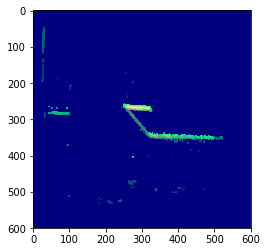

Image saved at:  200_2-060_2_slam slice_no_28.jpeg
29 out of 110 tiles(600, 600, 3)


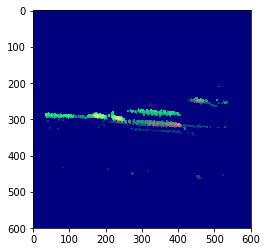

Image saved at:  200_2-060_2_slam slice_no_29.jpeg
30 out of 110 tiles(600, 600, 3)


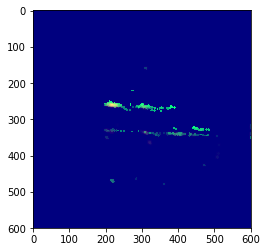

Image saved at:  200_2-060_2_slam slice_no_30.jpeg
31 out of 110 tiles(600, 600, 3)


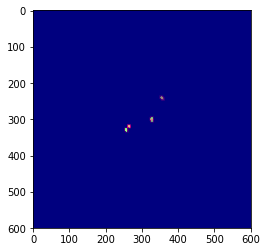

Image saved at:  200_2-060_2_slam slice_no_31.jpeg
35 out of 110 tiles(600, 600, 3)


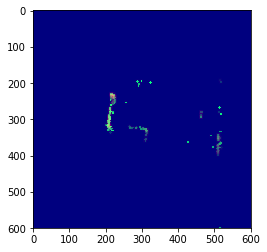

Image saved at:  200_2-060_2_slam slice_no_35.jpeg
36 out of 110 tiles(600, 600, 3)


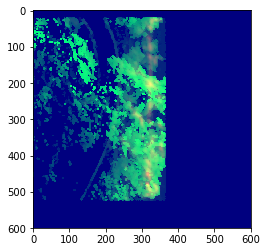

Image saved at:  200_2-060_2_slam slice_no_36.jpeg
37 out of 110 tiles(600, 600, 3)


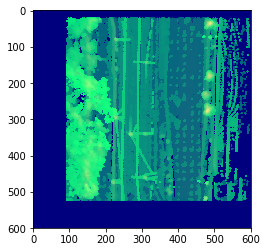

Image saved at:  200_2-060_2_slam slice_no_37.jpeg
38 out of 110 tiles(600, 600, 3)


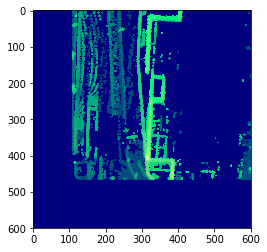

Image saved at:  200_2-060_2_slam slice_no_38.jpeg
39 out of 110 tiles(600, 600, 3)


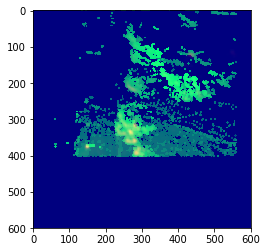

Image saved at:  200_2-060_2_slam slice_no_39.jpeg
40 out of 110 tiles(600, 600, 3)


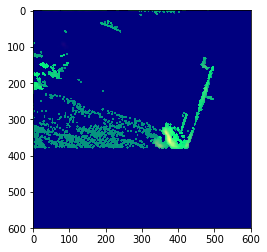

Image saved at:  200_2-060_2_slam slice_no_40.jpeg
41 out of 110 tiles(600, 600, 3)


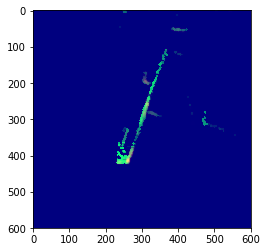

Image saved at:  200_2-060_2_slam slice_no_41.jpeg
43 out of 110 tiles(600, 600, 3)


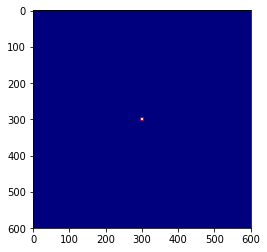

Image saved at:  200_2-060_2_slam slice_no_43.jpeg
46 out of 110 tiles(600, 600, 3)


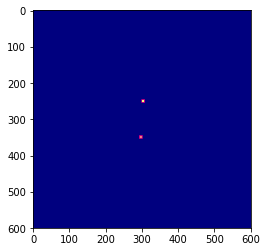

Image saved at:  200_2-060_2_slam slice_no_46.jpeg
47 out of 110 tiles(600, 600, 3)


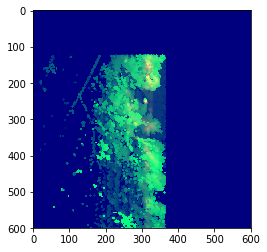

Image saved at:  200_2-060_2_slam slice_no_47.jpeg
48 out of 110 tiles(600, 600, 3)


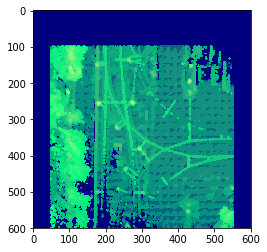

Image saved at:  200_2-060_2_slam slice_no_48.jpeg
49 out of 110 tiles(600, 600, 3)


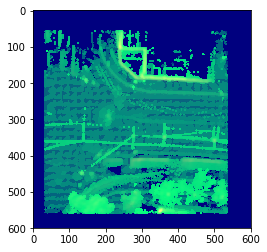

Image saved at:  200_2-060_2_slam slice_no_49.jpeg
50 out of 110 tiles(600, 600, 3)


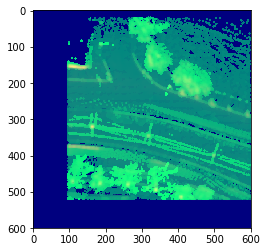

Image saved at:  200_2-060_2_slam slice_no_50.jpeg
51 out of 110 tiles(600, 600, 3)


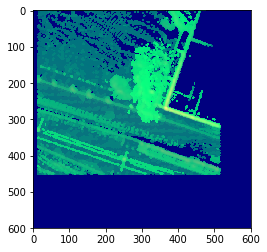

Image saved at:  200_2-060_2_slam slice_no_51.jpeg
52 out of 110 tiles(600, 600, 3)


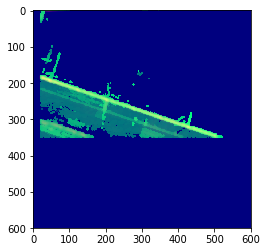

Image saved at:  200_2-060_2_slam slice_no_52.jpeg
53 out of 110 tiles(600, 600, 3)


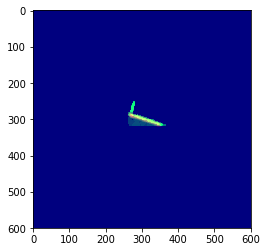

Image saved at:  200_2-060_2_slam slice_no_53.jpeg
54 out of 110 tiles(600, 600, 3)


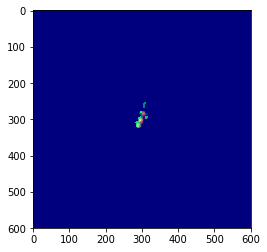

Image saved at:  200_2-060_2_slam slice_no_54.jpeg
58 out of 110 tiles(600, 600, 3)


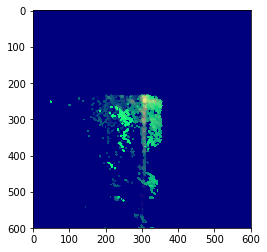

Image saved at:  200_2-060_2_slam slice_no_58.jpeg
59 out of 110 tiles(600, 600, 3)


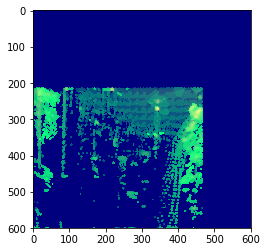

Image saved at:  200_2-060_2_slam slice_no_59.jpeg
60 out of 110 tiles(600, 600, 3)


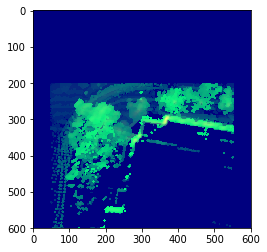

Image saved at:  200_2-060_2_slam slice_no_60.jpeg
61 out of 110 tiles(600, 600, 3)


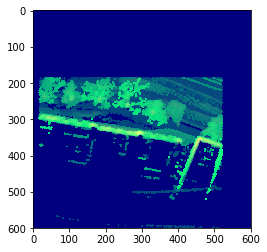

Image saved at:  200_2-060_2_slam slice_no_61.jpeg
62 out of 110 tiles(600, 600, 3)


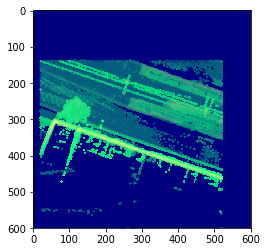

Image saved at:  200_2-060_2_slam slice_no_62.jpeg
63 out of 110 tiles(600, 600, 3)


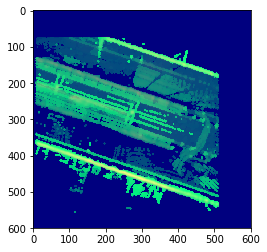

Image saved at:  200_2-060_2_slam slice_no_63.jpeg
64 out of 110 tiles(600, 600, 3)


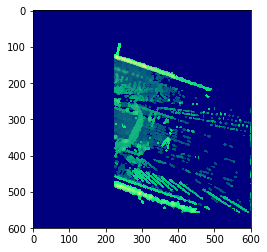

Image saved at:  200_2-060_2_slam slice_no_64.jpeg
65 out of 110 tiles(600, 600, 3)


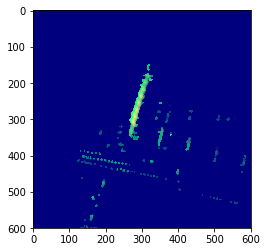

Image saved at:  200_2-060_2_slam slice_no_65.jpeg
66 out of 110 tiles(600, 600, 3)


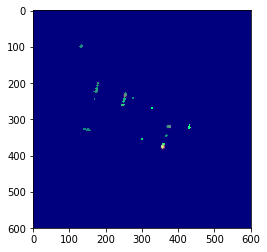

Image saved at:  200_2-060_2_slam slice_no_66.jpeg
69 out of 110 tiles(600, 600, 3)


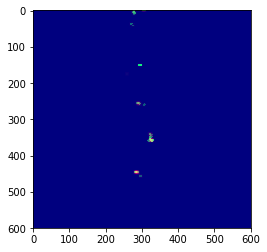

Image saved at:  200_2-060_2_slam slice_no_69.jpeg
70 out of 110 tiles(600, 600, 3)


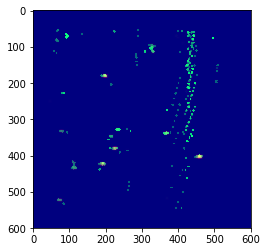

Image saved at:  200_2-060_2_slam slice_no_70.jpeg
71 out of 110 tiles(600, 600, 3)


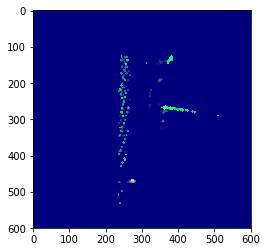

Image saved at:  200_2-060_2_slam slice_no_71.jpeg
72 out of 110 tiles(600, 600, 3)


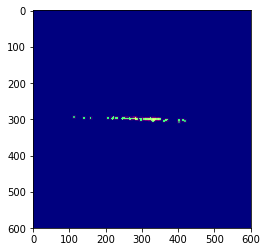

Image saved at:  200_2-060_2_slam slice_no_72.jpeg
73 out of 110 tiles(600, 600, 3)


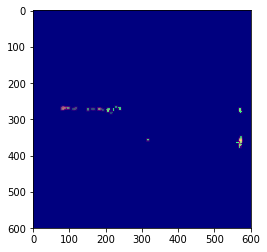

Image saved at:  200_2-060_2_slam slice_no_73.jpeg
74 out of 110 tiles(600, 600, 3)


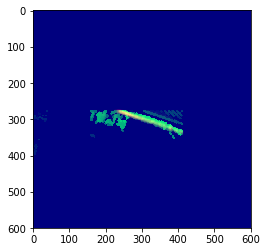

Image saved at:  200_2-060_2_slam slice_no_74.jpeg
75 out of 110 tiles(600, 600, 3)


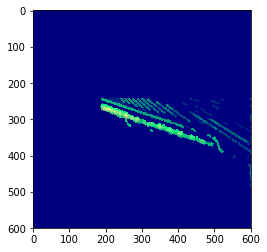

Image saved at:  200_2-060_2_slam slice_no_75.jpeg
76 out of 110 tiles(600, 600, 3)


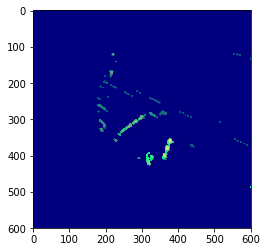

Image saved at:  200_2-060_2_slam slice_no_76.jpeg
77 out of 110 tiles(600, 600, 3)


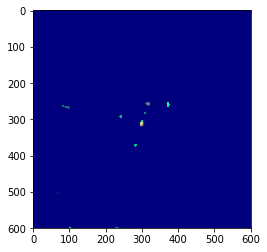

Image saved at:  200_2-060_2_slam slice_no_77.jpeg
80 out of 110 tiles(600, 600, 3)


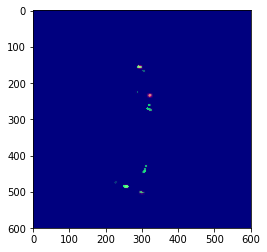

Image saved at:  200_2-060_2_slam slice_no_80.jpeg
81 out of 110 tiles(600, 600, 3)


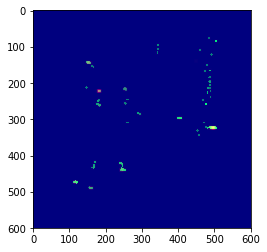

Image saved at:  200_2-060_2_slam slice_no_81.jpeg
82 out of 110 tiles(600, 600, 3)


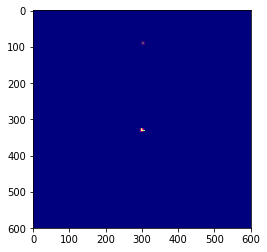

Image saved at:  200_2-060_2_slam slice_no_82.jpeg
83 out of 110 tiles(600, 600, 3)


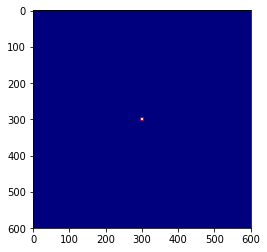

Image saved at:  200_2-060_2_slam slice_no_83.jpeg
91 out of 110 tiles(600, 600, 3)


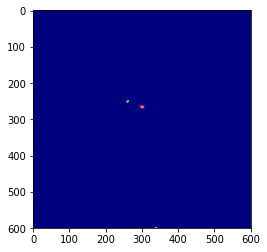

Image saved at:  200_2-060_2_slam slice_no_91.jpeg
92 out of 110 tiles(600, 600, 3)


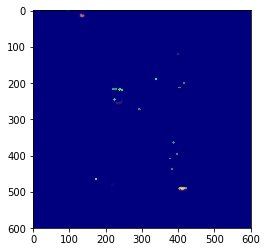

Image saved at:  200_2-060_2_slam slice_no_92.jpeg
99 out of 110 tiles(600, 600, 3)


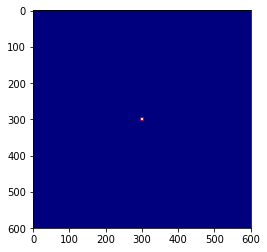

Image saved at:  200_2-060_2_slam slice_no_99.jpeg
102 out of 110 tiles(600, 600, 3)


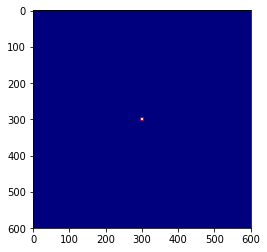

Image saved at:  200_2-060_2_slam slice_no_102.jpeg
103 out of 110 tiles(600, 600, 3)


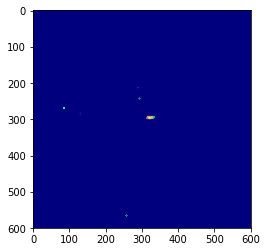

Image saved at:  200_2-060_2_slam slice_no_103.jpeg
110 out of 110 tilesReading File:  160_2-170_2_slam.pcd  From Path:  ../../data/pcd_files/
15 out of 300 tiles(600, 600, 3)


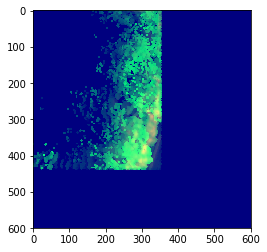

Image saved at:  160_2-170_2_slam slice_no_15.jpeg
16 out of 300 tiles(600, 600, 3)


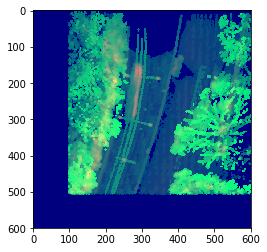

Image saved at:  160_2-170_2_slam slice_no_16.jpeg
17 out of 300 tiles(600, 600, 3)


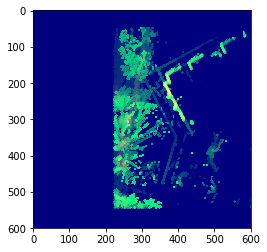

Image saved at:  160_2-170_2_slam slice_no_17.jpeg
18 out of 300 tiles(600, 600, 3)


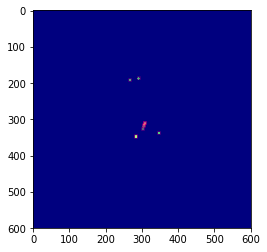

Image saved at:  160_2-170_2_slam slice_no_18.jpeg
19 out of 300 tiles(600, 600, 3)


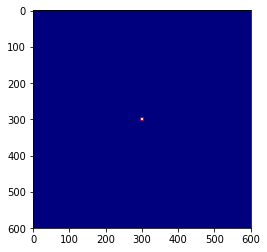

Image saved at:  160_2-170_2_slam slice_no_19.jpeg
20 out of 300 tiles(600, 600, 3)


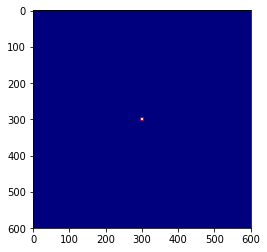

Image saved at:  160_2-170_2_slam slice_no_20.jpeg
34 out of 300 tiles(600, 600, 3)


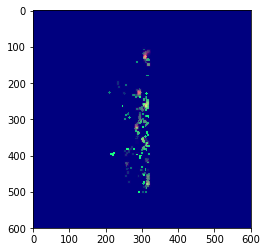

Image saved at:  160_2-170_2_slam slice_no_34.jpeg
35 out of 300 tiles(600, 600, 3)


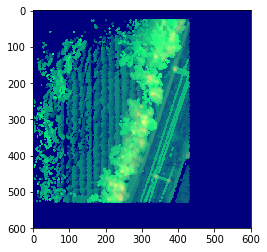

Image saved at:  160_2-170_2_slam slice_no_35.jpeg
36 out of 300 tiles(600, 600, 3)


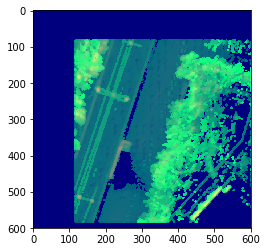

Image saved at:  160_2-170_2_slam slice_no_36.jpeg
37 out of 300 tiles(600, 600, 3)


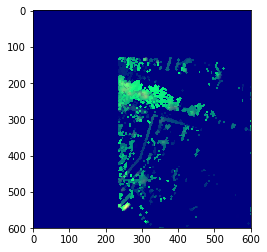

Image saved at:  160_2-170_2_slam slice_no_37.jpeg
38 out of 300 tiles(600, 600, 3)


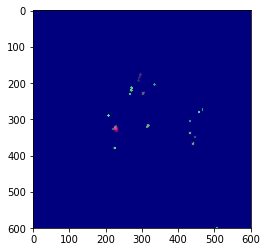

Image saved at:  160_2-170_2_slam slice_no_38.jpeg
39 out of 300 tiles(600, 600, 3)


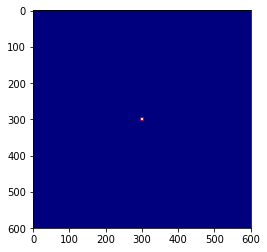

Image saved at:  160_2-170_2_slam slice_no_39.jpeg
40 out of 300 tiles(600, 600, 3)


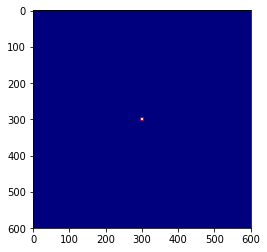

Image saved at:  160_2-170_2_slam slice_no_40.jpeg
54 out of 300 tiles(600, 600, 3)


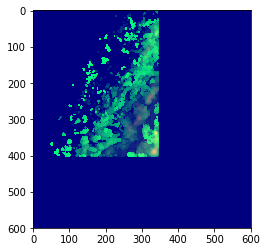

Image saved at:  160_2-170_2_slam slice_no_54.jpeg
55 out of 300 tiles(600, 600, 3)


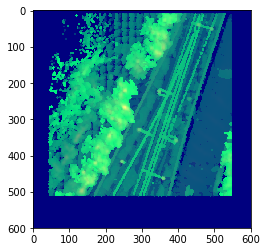

Image saved at:  160_2-170_2_slam slice_no_55.jpeg
56 out of 300 tiles(600, 600, 3)


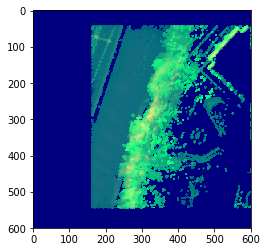

Image saved at:  160_2-170_2_slam slice_no_56.jpeg
57 out of 300 tiles(600, 600, 3)


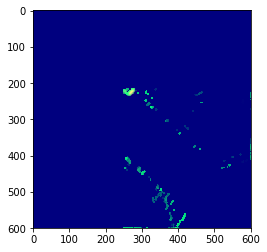

Image saved at:  160_2-170_2_slam slice_no_57.jpeg
58 out of 300 tiles(600, 600, 3)


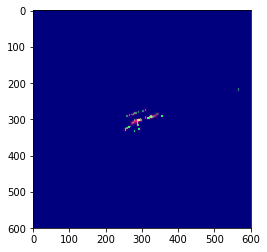

Image saved at:  160_2-170_2_slam slice_no_58.jpeg
72 out of 300 tiles(600, 600, 3)


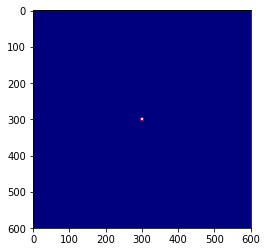

Image saved at:  160_2-170_2_slam slice_no_72.jpeg
73 out of 300 tiles(600, 600, 3)


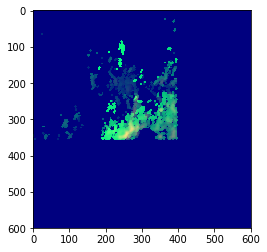

Image saved at:  160_2-170_2_slam slice_no_73.jpeg
74 out of 300 tiles(600, 600, 3)


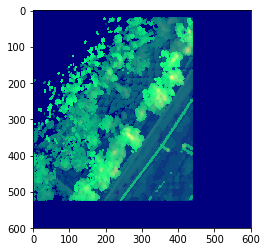

Image saved at:  160_2-170_2_slam slice_no_74.jpeg
75 out of 300 tiles(600, 600, 3)


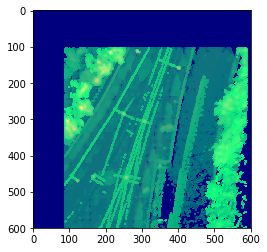

Image saved at:  160_2-170_2_slam slice_no_75.jpeg
76 out of 300 tiles(600, 600, 3)


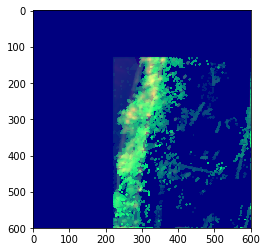

Image saved at:  160_2-170_2_slam slice_no_76.jpeg
77 out of 300 tiles(600, 600, 3)


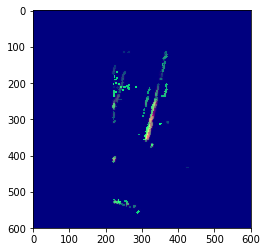

Image saved at:  160_2-170_2_slam slice_no_77.jpeg
92 out of 300 tiles(600, 600, 3)


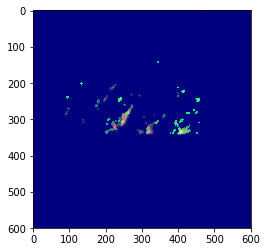

Image saved at:  160_2-170_2_slam slice_no_92.jpeg
93 out of 300 tiles(600, 600, 3)


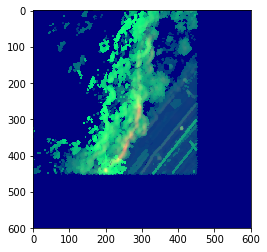

Image saved at:  160_2-170_2_slam slice_no_93.jpeg
94 out of 300 tiles(600, 600, 3)


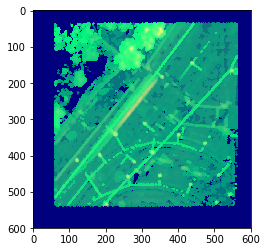

Image saved at:  160_2-170_2_slam slice_no_94.jpeg
95 out of 300 tiles(600, 600, 3)


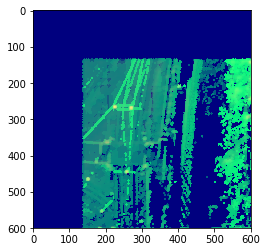

Image saved at:  160_2-170_2_slam slice_no_95.jpeg
96 out of 300 tiles(600, 600, 3)


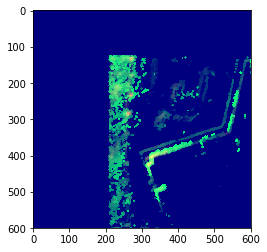

Image saved at:  160_2-170_2_slam slice_no_96.jpeg
97 out of 300 tiles(600, 600, 3)


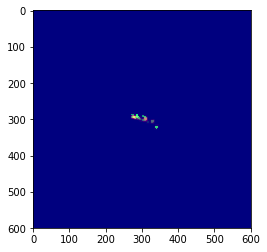

Image saved at:  160_2-170_2_slam slice_no_97.jpeg
110 out of 300 tiles(600, 600, 3)


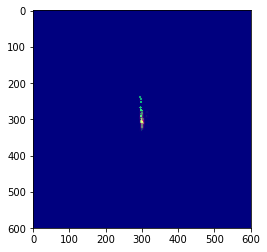

Image saved at:  160_2-170_2_slam slice_no_110.jpeg
111 out of 300 tiles(600, 600, 3)


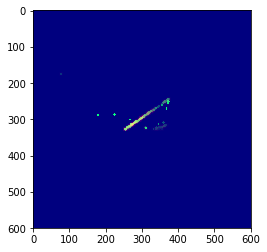

Image saved at:  160_2-170_2_slam slice_no_111.jpeg
112 out of 300 tiles(600, 600, 3)


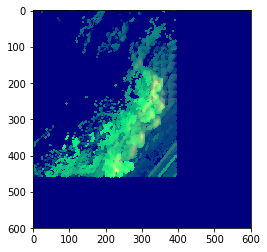

Image saved at:  160_2-170_2_slam slice_no_112.jpeg
113 out of 300 tiles(600, 600, 3)


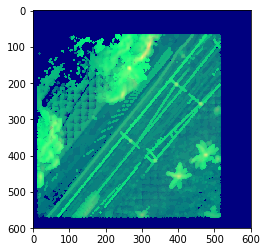

Image saved at:  160_2-170_2_slam slice_no_113.jpeg
114 out of 300 tiles(600, 600, 3)


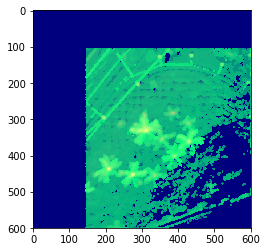

Image saved at:  160_2-170_2_slam slice_no_114.jpeg
115 out of 300 tiles(600, 600, 3)


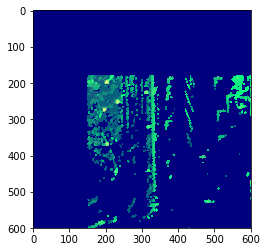

Image saved at:  160_2-170_2_slam slice_no_115.jpeg
116 out of 300 tiles(600, 600, 3)


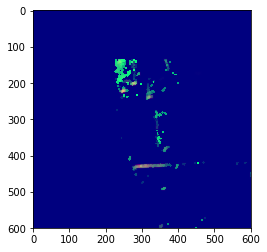

Image saved at:  160_2-170_2_slam slice_no_116.jpeg
117 out of 300 tiles(600, 600, 3)


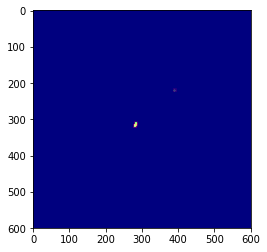

Image saved at:  160_2-170_2_slam slice_no_117.jpeg
129 out of 300 tiles(600, 600, 3)


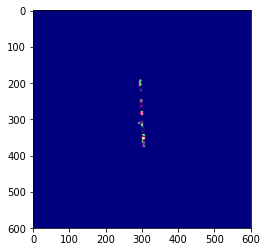

Image saved at:  160_2-170_2_slam slice_no_129.jpeg
130 out of 300 tiles(600, 600, 3)


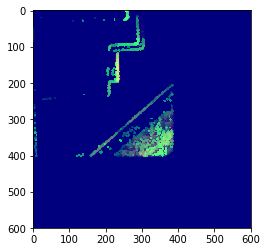

Image saved at:  160_2-170_2_slam slice_no_130.jpeg
131 out of 300 tiles(600, 600, 3)


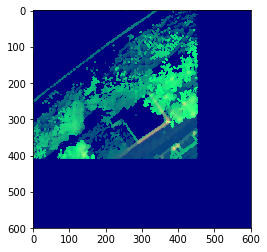

Image saved at:  160_2-170_2_slam slice_no_131.jpeg
132 out of 300 tiles(600, 600, 3)


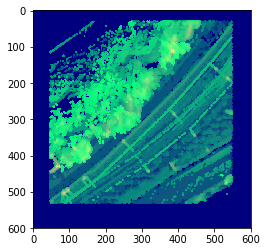

Image saved at:  160_2-170_2_slam slice_no_132.jpeg
133 out of 300 tiles(600, 600, 3)


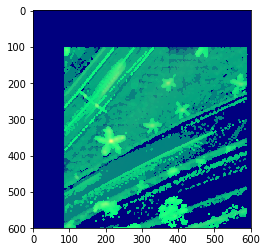

Image saved at:  160_2-170_2_slam slice_no_133.jpeg
134 out of 300 tiles(600, 600, 3)


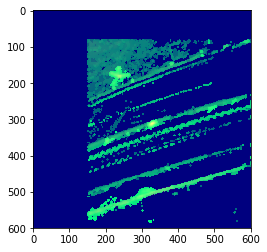

Image saved at:  160_2-170_2_slam slice_no_134.jpeg
135 out of 300 tiles(600, 600, 3)


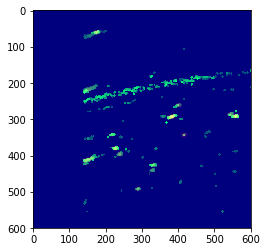

Image saved at:  160_2-170_2_slam slice_no_135.jpeg
136 out of 300 tiles(600, 600, 3)


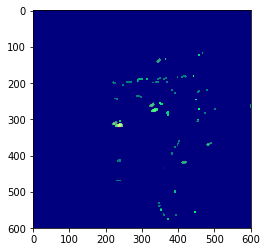

Image saved at:  160_2-170_2_slam slice_no_136.jpeg
137 out of 300 tiles(600, 600, 3)


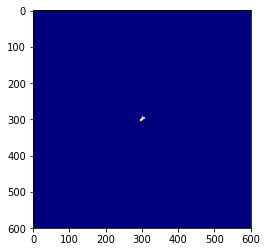

Image saved at:  160_2-170_2_slam slice_no_137.jpeg
144 out of 300 tiles(600, 600, 3)


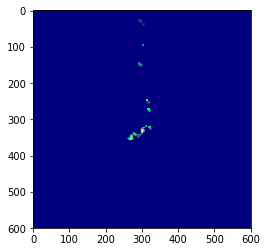

Image saved at:  160_2-170_2_slam slice_no_144.jpeg
145 out of 300 tiles(600, 600, 3)


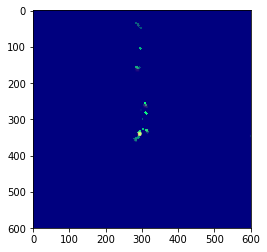

Image saved at:  160_2-170_2_slam slice_no_145.jpeg
146 out of 300 tiles(600, 600, 3)


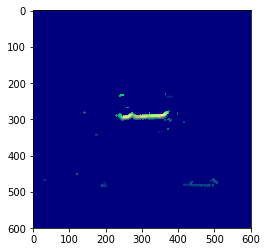

Image saved at:  160_2-170_2_slam slice_no_146.jpeg
147 out of 300 tiles(600, 600, 3)


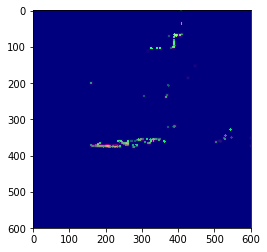

Image saved at:  160_2-170_2_slam slice_no_147.jpeg
148 out of 300 tiles(600, 600, 3)


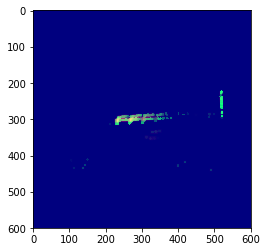

Image saved at:  160_2-170_2_slam slice_no_148.jpeg
149 out of 300 tiles(600, 600, 3)


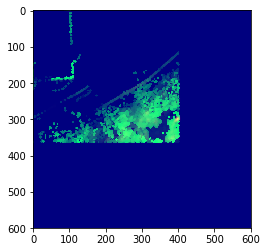

Image saved at:  160_2-170_2_slam slice_no_149.jpeg
150 out of 300 tiles(600, 600, 3)


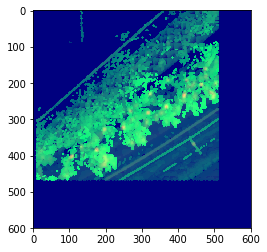

Image saved at:  160_2-170_2_slam slice_no_150.jpeg
151 out of 300 tiles(600, 600, 3)


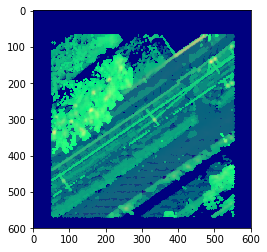

Image saved at:  160_2-170_2_slam slice_no_151.jpeg
152 out of 300 tiles(600, 600, 3)


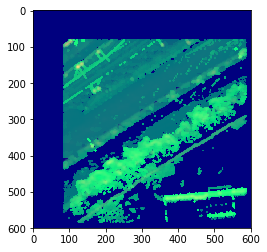

Image saved at:  160_2-170_2_slam slice_no_152.jpeg
153 out of 300 tiles(600, 600, 3)


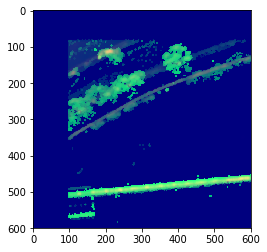

Image saved at:  160_2-170_2_slam slice_no_153.jpeg
154 out of 300 tiles(600, 600, 3)


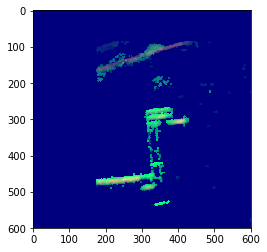

Image saved at:  160_2-170_2_slam slice_no_154.jpeg
155 out of 300 tiles(600, 600, 3)


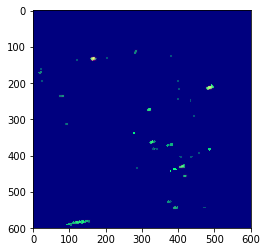

Image saved at:  160_2-170_2_slam slice_no_155.jpeg
156 out of 300 tiles(600, 600, 3)


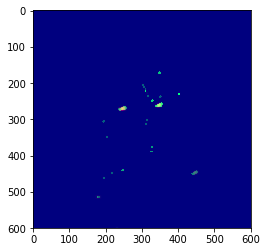

Image saved at:  160_2-170_2_slam slice_no_156.jpeg
162 out of 300 tiles(600, 600, 3)


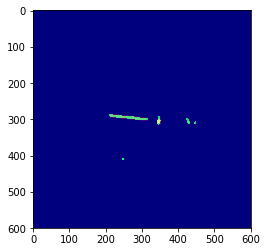

Image saved at:  160_2-170_2_slam slice_no_162.jpeg
164 out of 300 tiles(600, 600, 3)


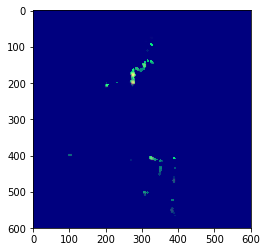

Image saved at:  160_2-170_2_slam slice_no_164.jpeg
165 out of 300 tiles(600, 600, 3)


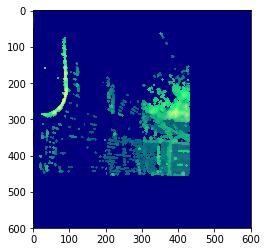

Image saved at:  160_2-170_2_slam slice_no_165.jpeg
166 out of 300 tiles(600, 600, 3)


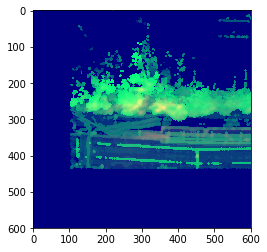

Image saved at:  160_2-170_2_slam slice_no_166.jpeg
167 out of 300 tiles(600, 600, 3)


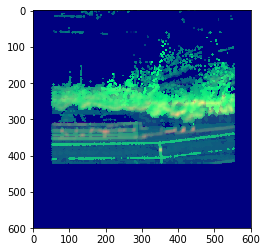

Image saved at:  160_2-170_2_slam slice_no_167.jpeg
168 out of 300 tiles(600, 600, 3)


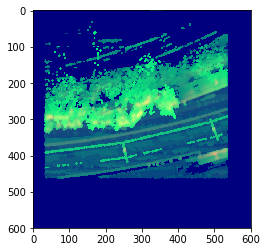

Image saved at:  160_2-170_2_slam slice_no_168.jpeg
169 out of 300 tiles(600, 600, 3)


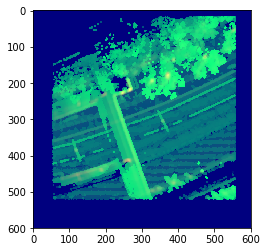

Image saved at:  160_2-170_2_slam slice_no_169.jpeg
170 out of 300 tiles(600, 600, 3)


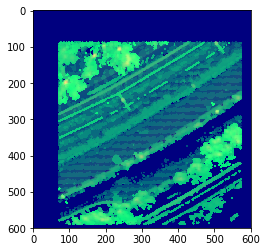

Image saved at:  160_2-170_2_slam slice_no_170.jpeg
171 out of 300 tiles(600, 600, 3)


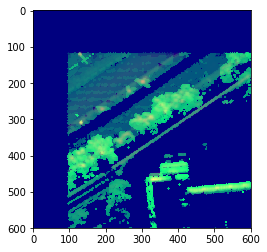

Image saved at:  160_2-170_2_slam slice_no_171.jpeg
172 out of 300 tiles(600, 600, 3)


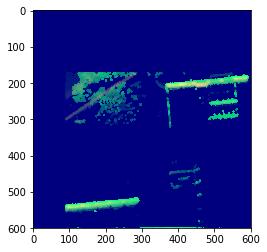

Image saved at:  160_2-170_2_slam slice_no_172.jpeg
173 out of 300 tiles(600, 600, 3)


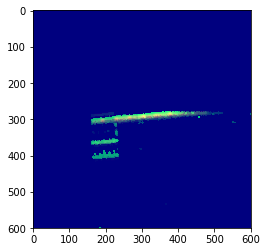

Image saved at:  160_2-170_2_slam slice_no_173.jpeg
174 out of 300 tiles(600, 600, 3)


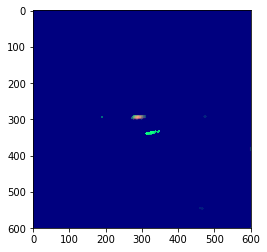

Image saved at:  160_2-170_2_slam slice_no_174.jpeg
175 out of 300 tiles(600, 600, 3)


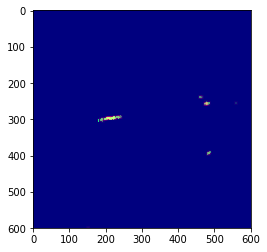

Image saved at:  160_2-170_2_slam slice_no_175.jpeg
176 out of 300 tiles(600, 600, 3)


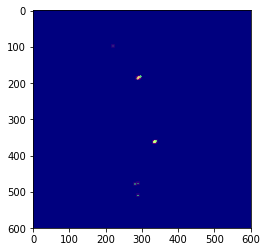

Image saved at:  160_2-170_2_slam slice_no_176.jpeg
181 out of 300 tiles(600, 600, 3)


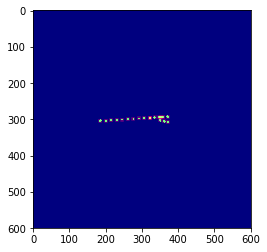

Image saved at:  160_2-170_2_slam slice_no_181.jpeg
182 out of 300 tiles(600, 600, 3)


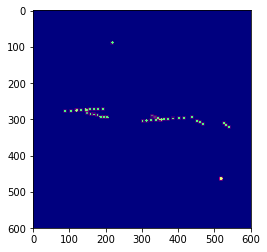

Image saved at:  160_2-170_2_slam slice_no_182.jpeg
183 out of 300 tiles(600, 600, 3)


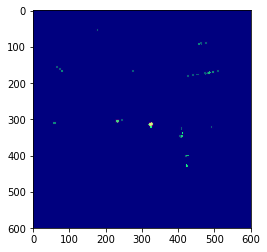

Image saved at:  160_2-170_2_slam slice_no_183.jpeg
184 out of 300 tiles(600, 600, 3)


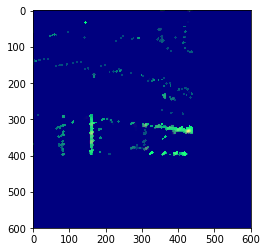

Image saved at:  160_2-170_2_slam slice_no_184.jpeg
185 out of 300 tiles(600, 600, 3)


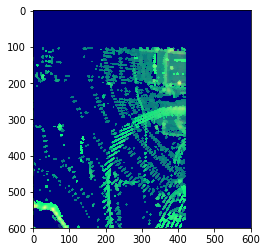

Image saved at:  160_2-170_2_slam slice_no_185.jpeg
186 out of 300 tiles(600, 600, 3)


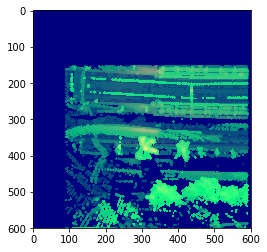

Image saved at:  160_2-170_2_slam slice_no_186.jpeg
187 out of 300 tiles(600, 600, 3)


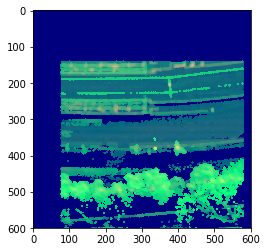

Image saved at:  160_2-170_2_slam slice_no_187.jpeg
188 out of 300 tiles(600, 600, 3)


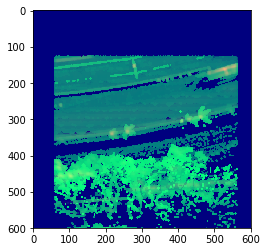

Image saved at:  160_2-170_2_slam slice_no_188.jpeg
189 out of 300 tiles(600, 600, 3)


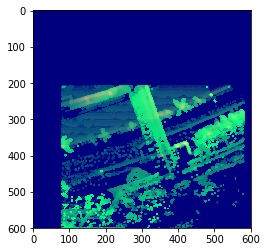

Image saved at:  160_2-170_2_slam slice_no_189.jpeg
190 out of 300 tiles(600, 600, 3)


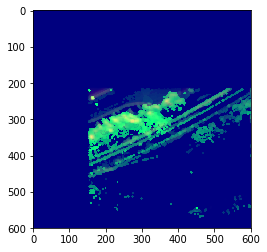

Image saved at:  160_2-170_2_slam slice_no_190.jpeg
191 out of 300 tiles(600, 600, 3)


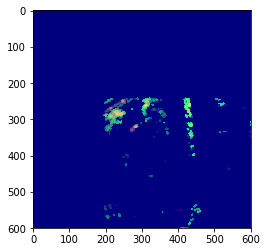

Image saved at:  160_2-170_2_slam slice_no_191.jpeg
192 out of 300 tiles(600, 600, 3)


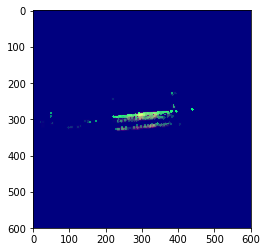

Image saved at:  160_2-170_2_slam slice_no_192.jpeg
193 out of 300 tiles(600, 600, 3)


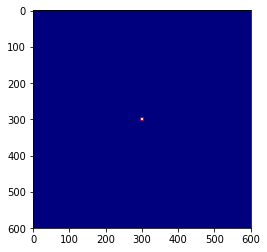

Image saved at:  160_2-170_2_slam slice_no_193.jpeg
194 out of 300 tiles(600, 600, 3)


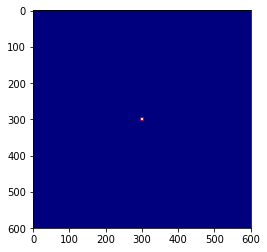

Image saved at:  160_2-170_2_slam slice_no_194.jpeg
195 out of 300 tiles(600, 600, 3)


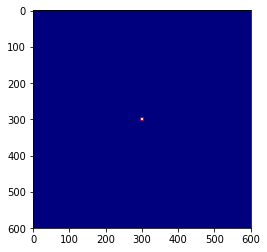

Image saved at:  160_2-170_2_slam slice_no_195.jpeg
196 out of 300 tiles(600, 600, 3)


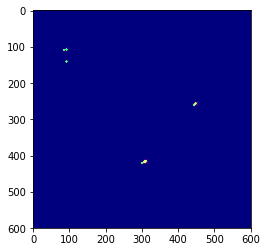

Image saved at:  160_2-170_2_slam slice_no_196.jpeg
197 out of 300 tiles(600, 600, 3)


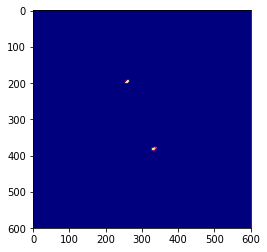

Image saved at:  160_2-170_2_slam slice_no_197.jpeg
202 out of 300 tiles(600, 600, 3)


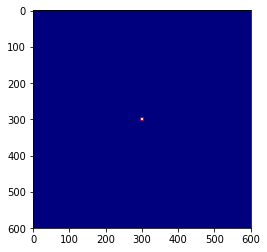

Image saved at:  160_2-170_2_slam slice_no_202.jpeg
203 out of 300 tiles(600, 600, 3)


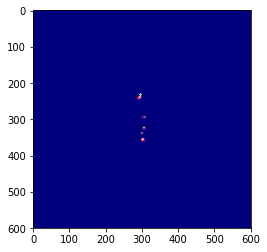

Image saved at:  160_2-170_2_slam slice_no_203.jpeg
204 out of 300 tiles(600, 600, 3)


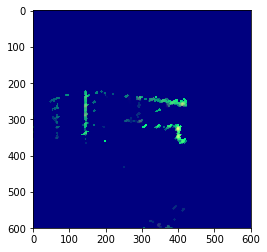

Image saved at:  160_2-170_2_slam slice_no_204.jpeg
205 out of 300 tiles(600, 600, 3)


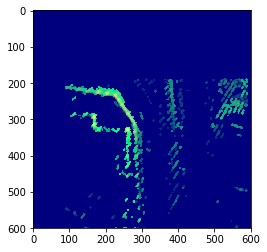

Image saved at:  160_2-170_2_slam slice_no_205.jpeg
206 out of 300 tiles(600, 600, 3)


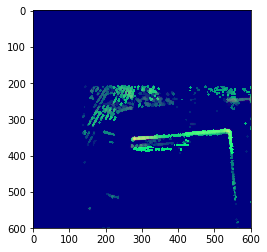

Image saved at:  160_2-170_2_slam slice_no_206.jpeg
207 out of 300 tiles(600, 600, 3)


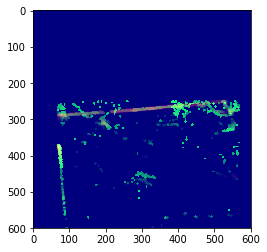

Image saved at:  160_2-170_2_slam slice_no_207.jpeg
208 out of 300 tiles(600, 600, 3)


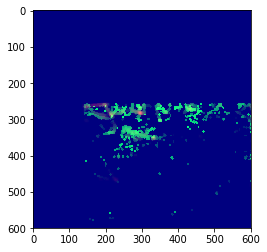

Image saved at:  160_2-170_2_slam slice_no_208.jpeg
209 out of 300 tiles(600, 600, 3)


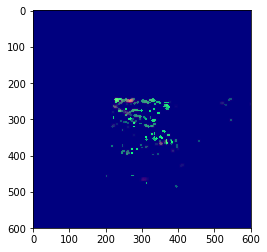

Image saved at:  160_2-170_2_slam slice_no_209.jpeg
210 out of 300 tiles(600, 600, 3)


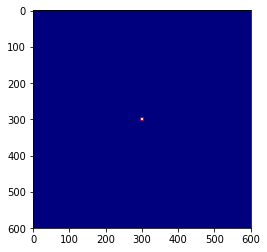

Image saved at:  160_2-170_2_slam slice_no_210.jpeg
211 out of 300 tiles(600, 600, 3)


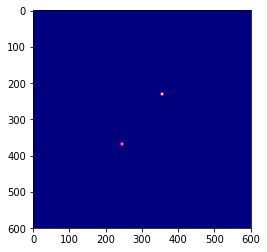

Image saved at:  160_2-170_2_slam slice_no_211.jpeg
212 out of 300 tiles(600, 600, 3)


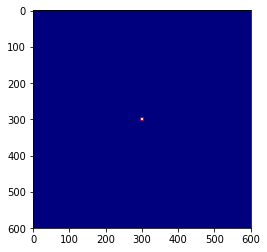

Image saved at:  160_2-170_2_slam slice_no_212.jpeg
224 out of 300 tiles(600, 600, 3)


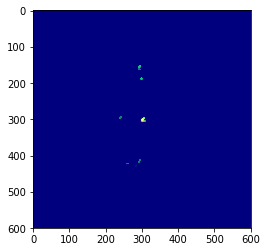

Image saved at:  160_2-170_2_slam slice_no_224.jpeg
225 out of 300 tiles(600, 600, 3)


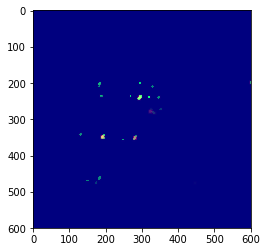

Image saved at:  160_2-170_2_slam slice_no_225.jpeg
226 out of 300 tiles(600, 600, 3)


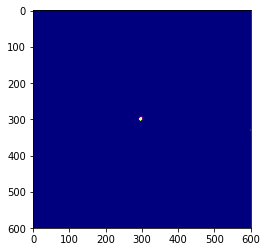

Image saved at:  160_2-170_2_slam slice_no_226.jpeg
227 out of 300 tiles(600, 600, 3)


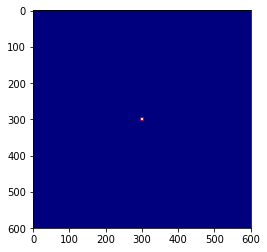

Image saved at:  160_2-170_2_slam slice_no_227.jpeg
228 out of 300 tiles(600, 600, 3)


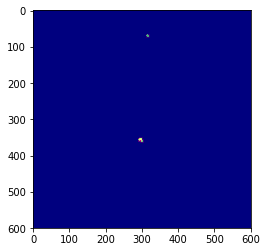

Image saved at:  160_2-170_2_slam slice_no_228.jpeg
230 out of 300 tiles(600, 600, 3)


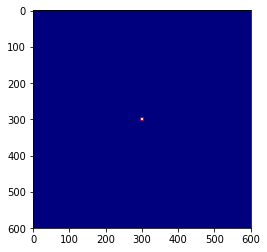

Image saved at:  160_2-170_2_slam slice_no_230.jpeg
248 out of 300 tiles(600, 600, 3)


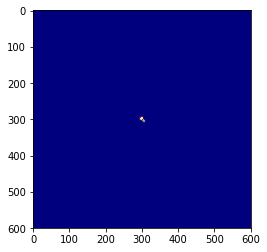

Image saved at:  160_2-170_2_slam slice_no_248.jpeg
250 out of 300 tiles(600, 600, 3)


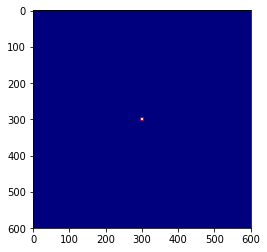

Image saved at:  160_2-170_2_slam slice_no_250.jpeg
266 out of 300 tiles(600, 600, 3)


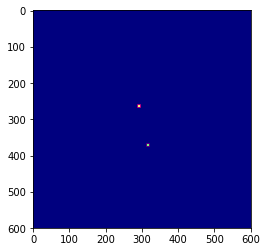

Image saved at:  160_2-170_2_slam slice_no_266.jpeg
286 out of 300 tiles(600, 600, 3)


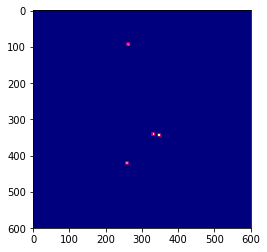

Image saved at:  160_2-170_2_slam slice_no_286.jpeg
300 out of 300 tilesReading File:  295_2-280_4_slam.pcd  From Path:  ../../data/pcd_files/
5 out of 160 tiles(600, 600, 3)


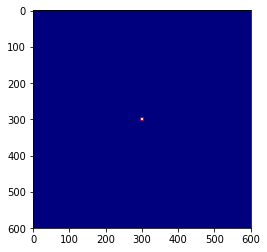

Image saved at:  295_2-280_4_slam slice_no_5.jpeg
6 out of 160 tiles(600, 600, 3)


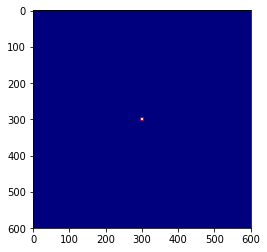

Image saved at:  295_2-280_4_slam slice_no_6.jpeg
7 out of 160 tiles(600, 600, 3)


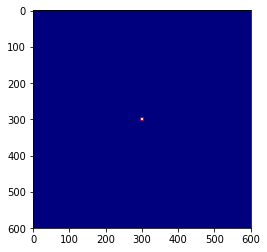

Image saved at:  295_2-280_4_slam slice_no_7.jpeg
8 out of 160 tiles(600, 600, 3)


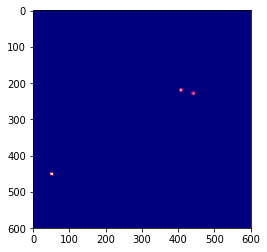

Image saved at:  295_2-280_4_slam slice_no_8.jpeg
9 out of 160 tiles(600, 600, 3)


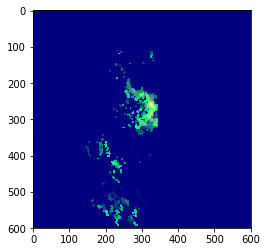

Image saved at:  295_2-280_4_slam slice_no_9.jpeg
10 out of 160 tiles(600, 600, 3)


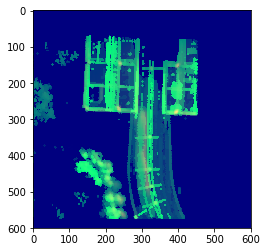

Image saved at:  295_2-280_4_slam slice_no_10.jpeg
11 out of 160 tiles(600, 600, 3)


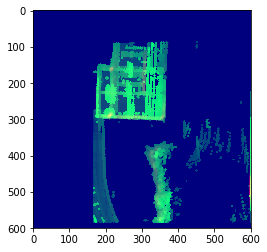

Image saved at:  295_2-280_4_slam slice_no_11.jpeg
12 out of 160 tiles(600, 600, 3)


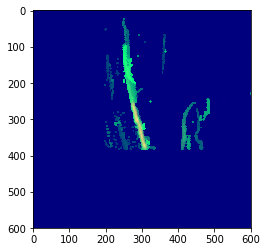

Image saved at:  295_2-280_4_slam slice_no_12.jpeg
13 out of 160 tiles(600, 600, 3)


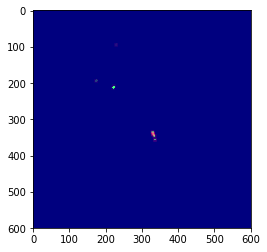

Image saved at:  295_2-280_4_slam slice_no_13.jpeg
16 out of 160 tiles(600, 600, 3)


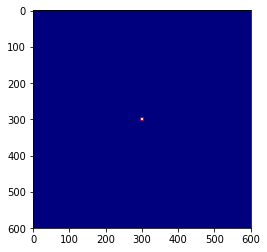

Image saved at:  295_2-280_4_slam slice_no_16.jpeg
23 out of 160 tiles(600, 600, 3)


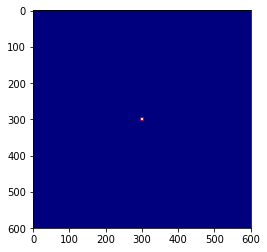

Image saved at:  295_2-280_4_slam slice_no_23.jpeg
24 out of 160 tiles(600, 600, 3)


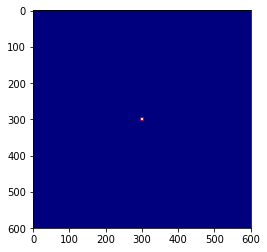

Image saved at:  295_2-280_4_slam slice_no_24.jpeg
25 out of 160 tiles(600, 600, 3)


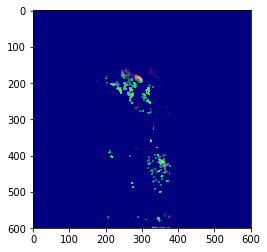

Image saved at:  295_2-280_4_slam slice_no_25.jpeg
26 out of 160 tiles(600, 600, 3)


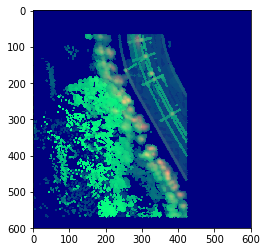

Image saved at:  295_2-280_4_slam slice_no_26.jpeg
27 out of 160 tiles(600, 600, 3)


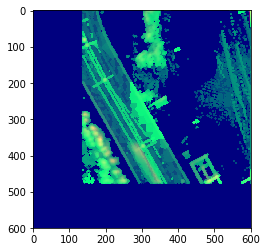

Image saved at:  295_2-280_4_slam slice_no_27.jpeg
28 out of 160 tiles(600, 600, 3)


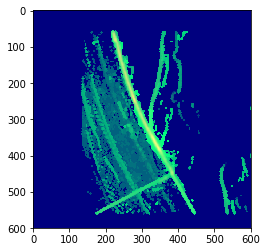

Image saved at:  295_2-280_4_slam slice_no_28.jpeg
29 out of 160 tiles(600, 600, 3)


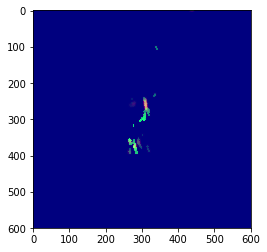

Image saved at:  295_2-280_4_slam slice_no_29.jpeg
32 out of 160 tiles(600, 600, 3)


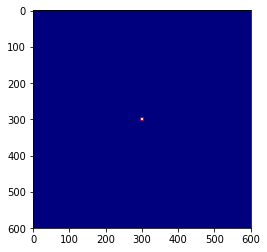

Image saved at:  295_2-280_4_slam slice_no_32.jpeg
41 out of 160 tiles(600, 600, 3)


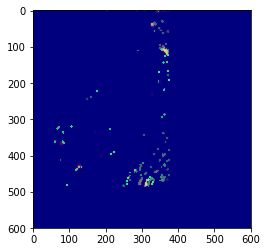

Image saved at:  295_2-280_4_slam slice_no_41.jpeg
42 out of 160 tiles(600, 600, 3)


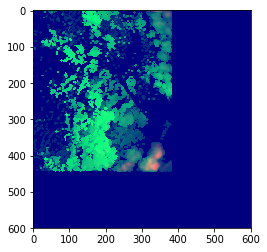

Image saved at:  295_2-280_4_slam slice_no_42.jpeg
43 out of 160 tiles(600, 600, 3)


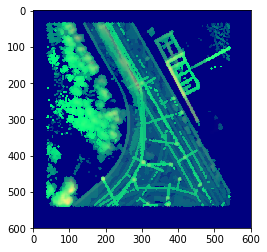

Image saved at:  295_2-280_4_slam slice_no_43.jpeg
44 out of 160 tiles(600, 600, 3)


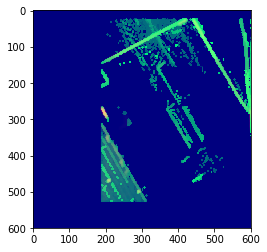

Image saved at:  295_2-280_4_slam slice_no_44.jpeg
45 out of 160 tiles(600, 600, 3)


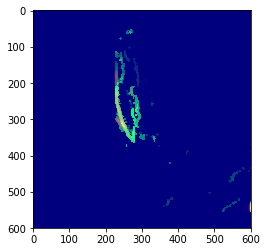

Image saved at:  295_2-280_4_slam slice_no_45.jpeg
46 out of 160 tiles(600, 600, 3)


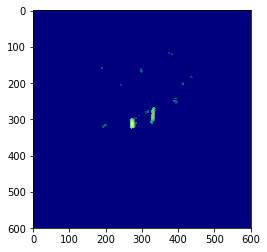

Image saved at:  295_2-280_4_slam slice_no_46.jpeg
47 out of 160 tiles(600, 600, 3)


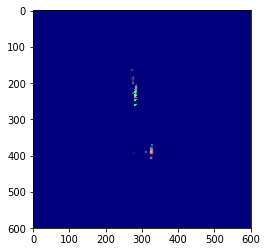

Image saved at:  295_2-280_4_slam slice_no_47.jpeg
51 out of 160 tiles(600, 600, 3)


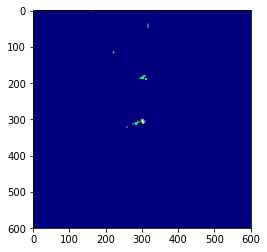

Image saved at:  295_2-280_4_slam slice_no_51.jpeg
52 out of 160 tiles(600, 600, 3)


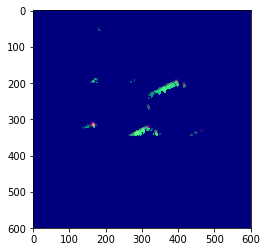

Image saved at:  295_2-280_4_slam slice_no_52.jpeg
53 out of 160 tiles(600, 600, 3)


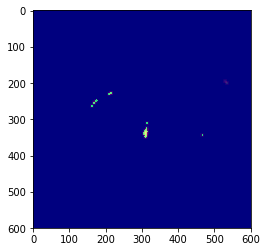

Image saved at:  295_2-280_4_slam slice_no_53.jpeg
54 out of 160 tiles(600, 600, 3)


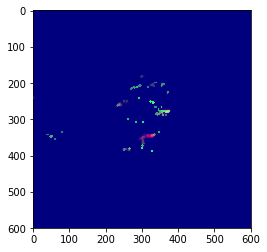

Image saved at:  295_2-280_4_slam slice_no_54.jpeg
55 out of 160 tiles(600, 600, 3)


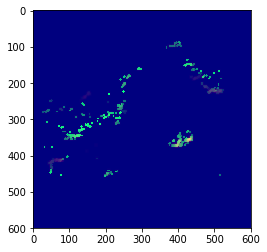

Image saved at:  295_2-280_4_slam slice_no_55.jpeg
56 out of 160 tiles(600, 600, 3)


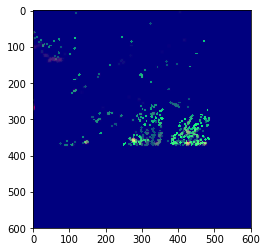

Image saved at:  295_2-280_4_slam slice_no_56.jpeg
57 out of 160 tiles(600, 600, 3)


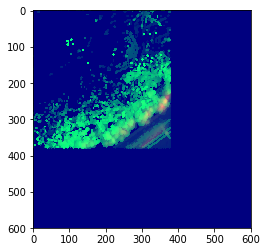

Image saved at:  295_2-280_4_slam slice_no_57.jpeg
58 out of 160 tiles(600, 600, 3)


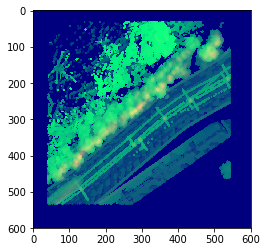

Image saved at:  295_2-280_4_slam slice_no_58.jpeg
59 out of 160 tiles(600, 600, 3)


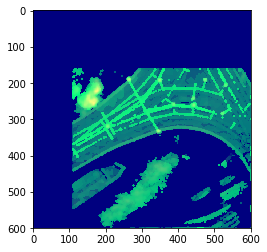

Image saved at:  295_2-280_4_slam slice_no_59.jpeg
60 out of 160 tiles(600, 600, 3)


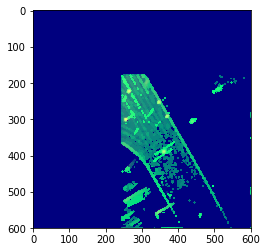

Image saved at:  295_2-280_4_slam slice_no_60.jpeg
61 out of 160 tiles(600, 600, 3)


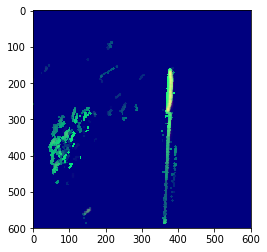

Image saved at:  295_2-280_4_slam slice_no_61.jpeg
62 out of 160 tiles(600, 600, 3)


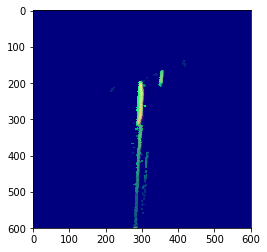

Image saved at:  295_2-280_4_slam slice_no_62.jpeg
63 out of 160 tiles(600, 600, 3)


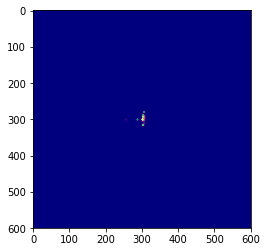

Image saved at:  295_2-280_4_slam slice_no_63.jpeg
67 out of 160 tiles(600, 600, 3)


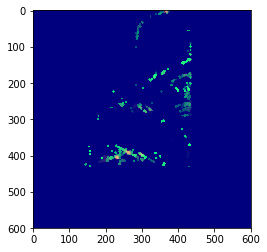

Image saved at:  295_2-280_4_slam slice_no_67.jpeg
68 out of 160 tiles(600, 600, 3)


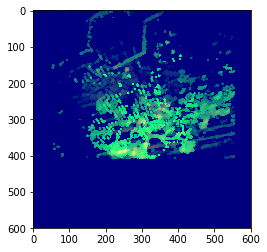

Image saved at:  295_2-280_4_slam slice_no_68.jpeg
69 out of 160 tiles(600, 600, 3)


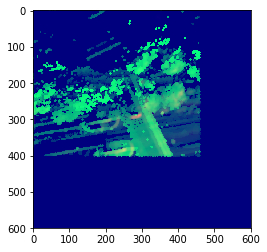

Image saved at:  295_2-280_4_slam slice_no_69.jpeg
70 out of 160 tiles(600, 600, 3)


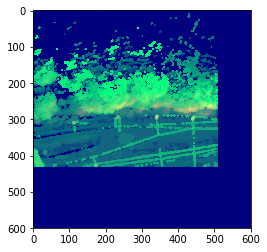

Image saved at:  295_2-280_4_slam slice_no_70.jpeg
71 out of 160 tiles(600, 600, 3)


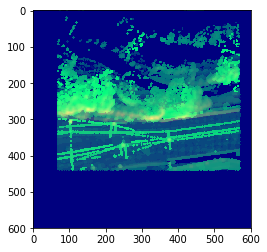

Image saved at:  295_2-280_4_slam slice_no_71.jpeg
72 out of 160 tiles(600, 600, 3)


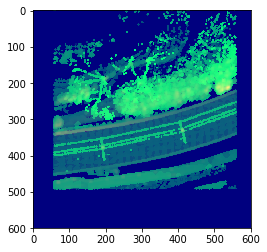

Image saved at:  295_2-280_4_slam slice_no_72.jpeg
73 out of 160 tiles(600, 600, 3)


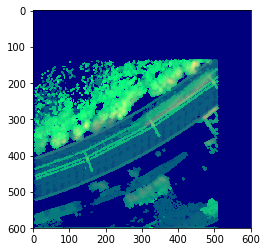

Image saved at:  295_2-280_4_slam slice_no_73.jpeg
74 out of 160 tiles(600, 600, 3)


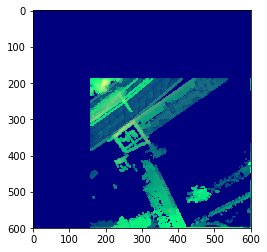

Image saved at:  295_2-280_4_slam slice_no_74.jpeg
75 out of 160 tiles(600, 600, 3)


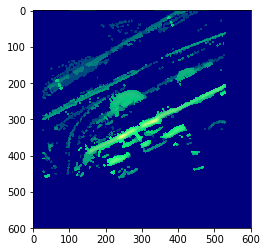

Image saved at:  295_2-280_4_slam slice_no_75.jpeg
76 out of 160 tiles(600, 600, 3)


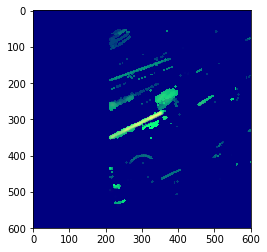

Image saved at:  295_2-280_4_slam slice_no_76.jpeg
77 out of 160 tiles(600, 600, 3)


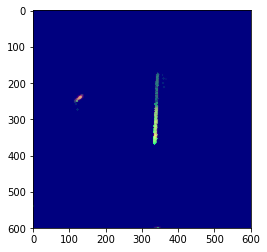

Image saved at:  295_2-280_4_slam slice_no_77.jpeg
78 out of 160 tiles(600, 600, 3)


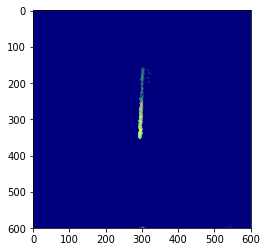

Image saved at:  295_2-280_4_slam slice_no_78.jpeg
81 out of 160 tiles(600, 600, 3)


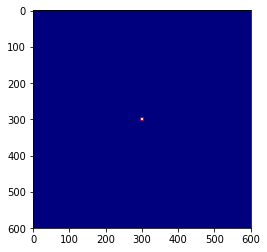

Image saved at:  295_2-280_4_slam slice_no_81.jpeg
82 out of 160 tiles(600, 600, 3)


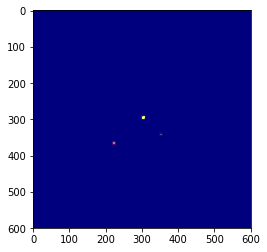

Image saved at:  295_2-280_4_slam slice_no_82.jpeg
83 out of 160 tiles(600, 600, 3)


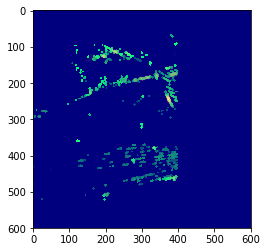

Image saved at:  295_2-280_4_slam slice_no_83.jpeg
84 out of 160 tiles(600, 600, 3)


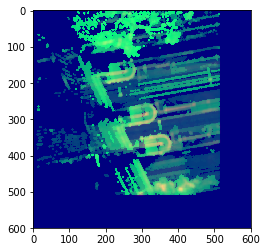

Image saved at:  295_2-280_4_slam slice_no_84.jpeg
85 out of 160 tiles(600, 600, 3)


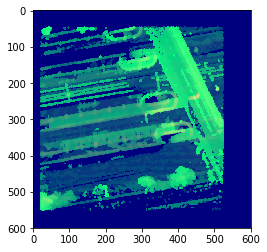

Image saved at:  295_2-280_4_slam slice_no_85.jpeg
86 out of 160 tiles(600, 600, 3)


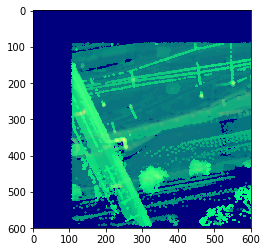

Image saved at:  295_2-280_4_slam slice_no_86.jpeg
87 out of 160 tiles(600, 600, 3)


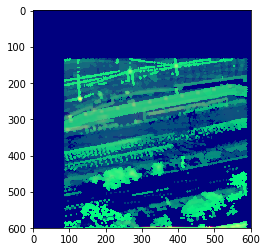

Image saved at:  295_2-280_4_slam slice_no_87.jpeg
88 out of 160 tiles(600, 600, 3)


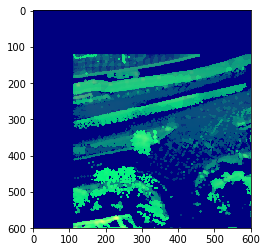

Image saved at:  295_2-280_4_slam slice_no_88.jpeg
89 out of 160 tiles(600, 600, 3)


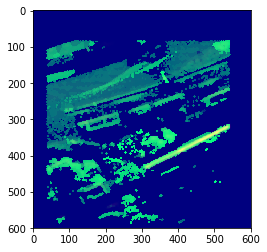

Image saved at:  295_2-280_4_slam slice_no_89.jpeg
90 out of 160 tiles(600, 600, 3)


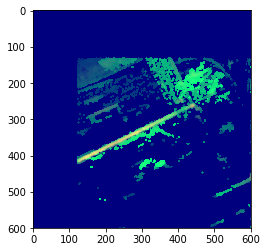

Image saved at:  295_2-280_4_slam slice_no_90.jpeg
91 out of 160 tiles(600, 600, 3)


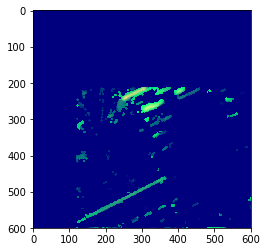

Image saved at:  295_2-280_4_slam slice_no_91.jpeg
92 out of 160 tiles(600, 600, 3)


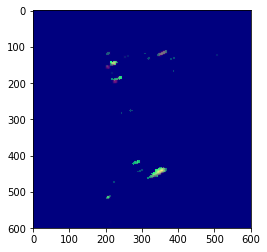

Image saved at:  295_2-280_4_slam slice_no_92.jpeg
93 out of 160 tiles(600, 600, 3)


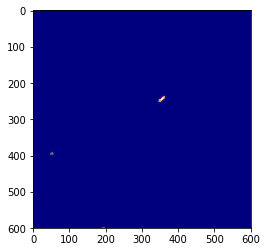

Image saved at:  295_2-280_4_slam slice_no_93.jpeg
94 out of 160 tiles(600, 600, 3)


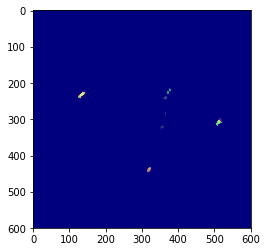

Image saved at:  295_2-280_4_slam slice_no_94.jpeg
95 out of 160 tiles(600, 600, 3)


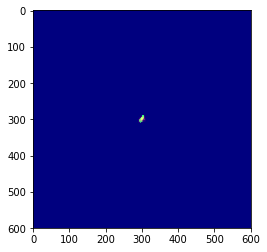

Image saved at:  295_2-280_4_slam slice_no_95.jpeg
97 out of 160 tiles(600, 600, 3)


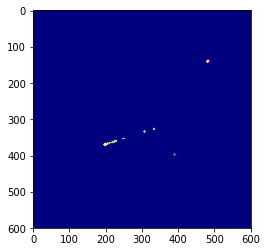

Image saved at:  295_2-280_4_slam slice_no_97.jpeg
98 out of 160 tiles(600, 600, 3)


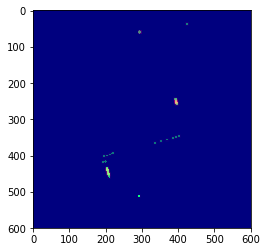

Image saved at:  295_2-280_4_slam slice_no_98.jpeg
99 out of 160 tiles(600, 600, 3)


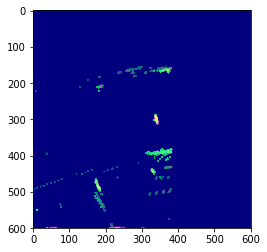

Image saved at:  295_2-280_4_slam slice_no_99.jpeg
100 out of 160 tiles(600, 600, 3)


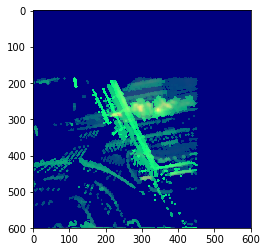

Image saved at:  295_2-280_4_slam slice_no_100.jpeg
101 out of 160 tiles(600, 600, 3)


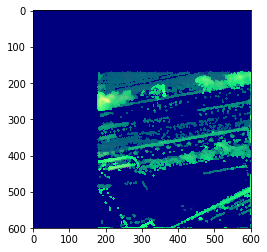

Image saved at:  295_2-280_4_slam slice_no_101.jpeg
102 out of 160 tiles(600, 600, 3)


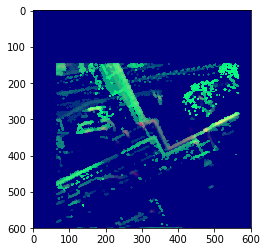

Image saved at:  295_2-280_4_slam slice_no_102.jpeg
103 out of 160 tiles(600, 600, 3)


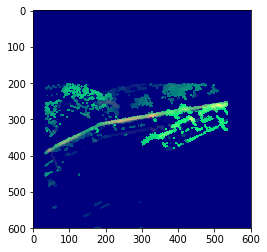

Image saved at:  295_2-280_4_slam slice_no_103.jpeg
104 out of 160 tiles(600, 600, 3)


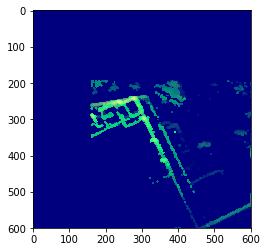

Image saved at:  295_2-280_4_slam slice_no_104.jpeg
105 out of 160 tiles(600, 600, 3)


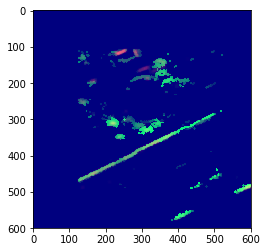

Image saved at:  295_2-280_4_slam slice_no_105.jpeg
106 out of 160 tiles(600, 600, 3)


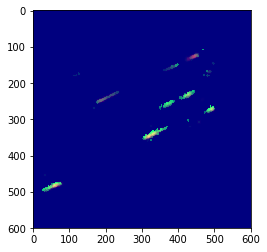

Image saved at:  295_2-280_4_slam slice_no_106.jpeg
107 out of 160 tiles(600, 600, 3)


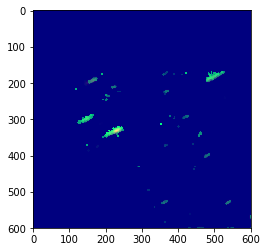

Image saved at:  295_2-280_4_slam slice_no_107.jpeg
108 out of 160 tiles(600, 600, 3)


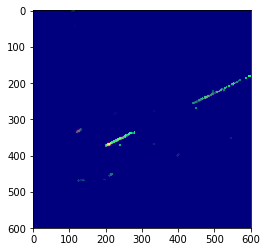

Image saved at:  295_2-280_4_slam slice_no_108.jpeg
109 out of 160 tiles(600, 600, 3)


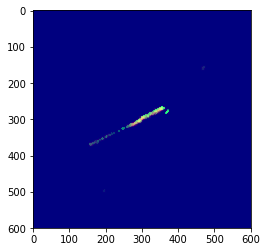

Image saved at:  295_2-280_4_slam slice_no_109.jpeg
110 out of 160 tiles(600, 600, 3)


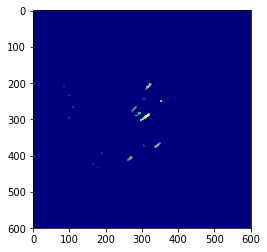

Image saved at:  295_2-280_4_slam slice_no_110.jpeg
111 out of 160 tiles(600, 600, 3)


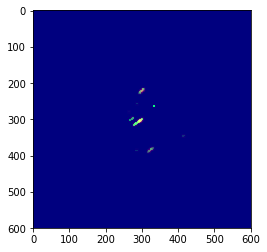

Image saved at:  295_2-280_4_slam slice_no_111.jpeg
113 out of 160 tiles(600, 600, 3)


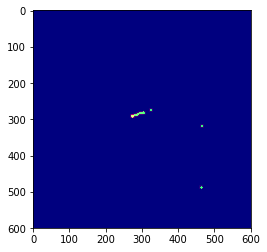

Image saved at:  295_2-280_4_slam slice_no_113.jpeg
114 out of 160 tiles(600, 600, 3)


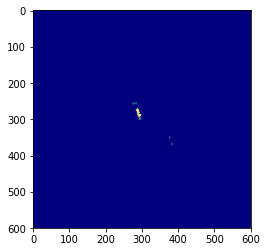

Image saved at:  295_2-280_4_slam slice_no_114.jpeg
115 out of 160 tiles(600, 600, 3)


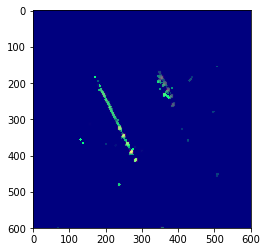

Image saved at:  295_2-280_4_slam slice_no_115.jpeg
116 out of 160 tiles(600, 600, 3)


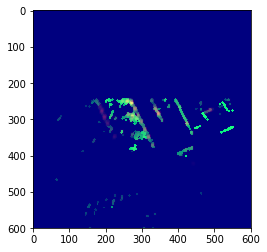

Image saved at:  295_2-280_4_slam slice_no_116.jpeg
117 out of 160 tiles(600, 600, 3)


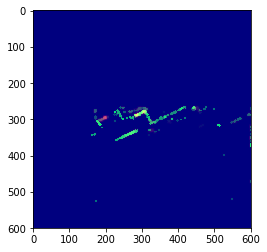

Image saved at:  295_2-280_4_slam slice_no_117.jpeg
118 out of 160 tiles(600, 600, 3)


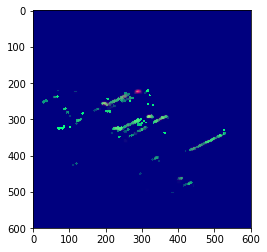

Image saved at:  295_2-280_4_slam slice_no_118.jpeg
119 out of 160 tiles(600, 600, 3)


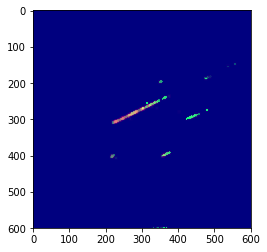

Image saved at:  295_2-280_4_slam slice_no_119.jpeg
120 out of 160 tiles(600, 600, 3)


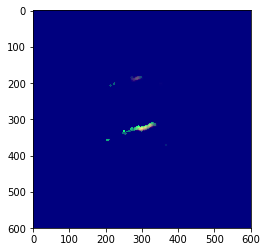

Image saved at:  295_2-280_4_slam slice_no_120.jpeg
121 out of 160 tiles(600, 600, 3)


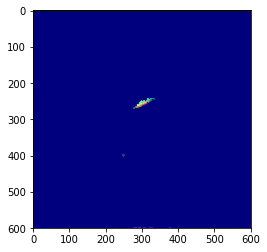

Image saved at:  295_2-280_4_slam slice_no_121.jpeg
123 out of 160 tiles(600, 600, 3)


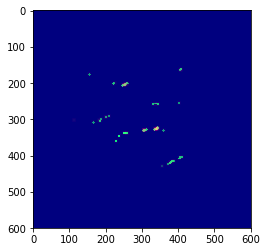

Image saved at:  295_2-280_4_slam slice_no_123.jpeg
124 out of 160 tiles(600, 600, 3)


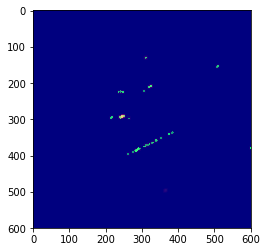

Image saved at:  295_2-280_4_slam slice_no_124.jpeg
125 out of 160 tiles(600, 600, 3)


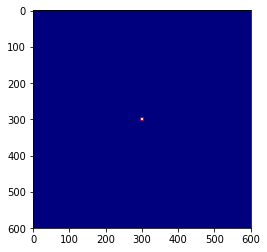

Image saved at:  295_2-280_4_slam slice_no_125.jpeg
126 out of 160 tiles(600, 600, 3)


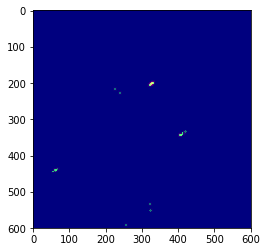

Image saved at:  295_2-280_4_slam slice_no_126.jpeg
127 out of 160 tiles(600, 600, 3)


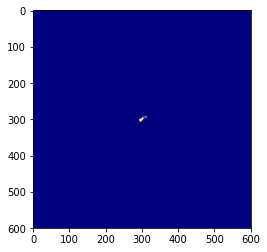

Image saved at:  295_2-280_4_slam slice_no_127.jpeg
130 out of 160 tiles(600, 600, 3)


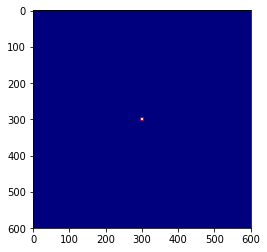

Image saved at:  295_2-280_4_slam slice_no_130.jpeg
131 out of 160 tiles(600, 600, 3)


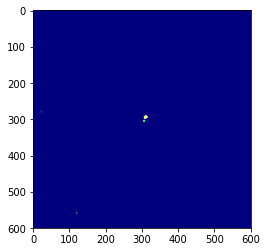

Image saved at:  295_2-280_4_slam slice_no_131.jpeg
132 out of 160 tiles(600, 600, 3)


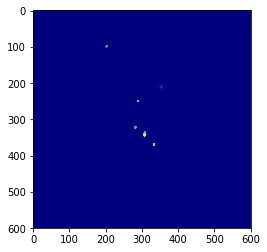

Image saved at:  295_2-280_4_slam slice_no_132.jpeg
135 out of 160 tiles(600, 600, 3)


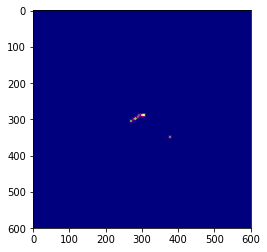

Image saved at:  295_2-280_4_slam slice_no_135.jpeg
137 out of 160 tiles(600, 600, 3)


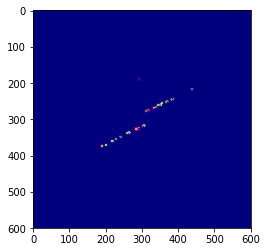

Image saved at:  295_2-280_4_slam slice_no_137.jpeg
142 out of 160 tiles(600, 600, 3)


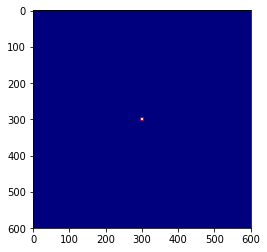

Image saved at:  295_2-280_4_slam slice_no_142.jpeg
147 out of 160 tiles(600, 600, 3)


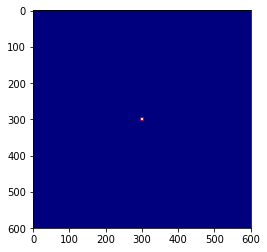

Image saved at:  295_2-280_4_slam slice_no_147.jpeg
149 out of 160 tiles(600, 600, 3)


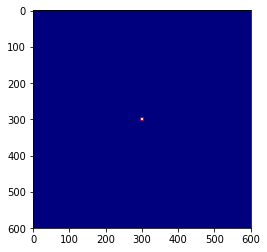

Image saved at:  295_2-280_4_slam slice_no_149.jpeg
152 out of 160 tiles(600, 600, 3)


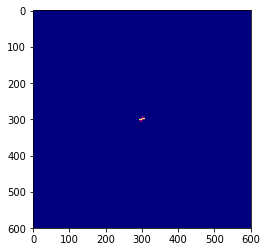

Image saved at:  295_2-280_4_slam slice_no_152.jpeg
160 out of 160 tilesReading File:  060_2-295_2_slam.pcd  From Path:  ../../data/pcd_files/
5 out of 160 tiles(600, 600, 3)


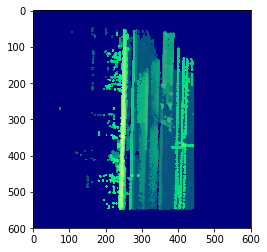

Image saved at:  060_2-295_2_slam slice_no_5.jpeg
6 out of 160 tiles(600, 600, 3)


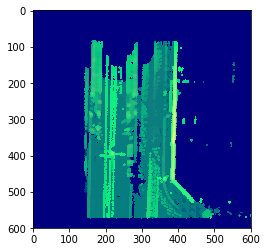

Image saved at:  060_2-295_2_slam slice_no_6.jpeg
7 out of 160 tiles(600, 600, 3)


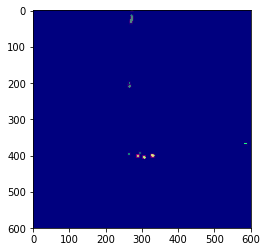

Image saved at:  060_2-295_2_slam slice_no_7.jpeg
8 out of 160 tiles(600, 600, 3)


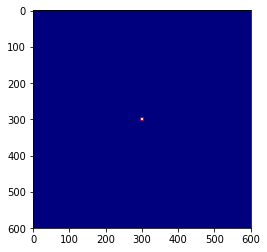

Image saved at:  060_2-295_2_slam slice_no_8.jpeg
13 out of 160 tiles(600, 600, 3)


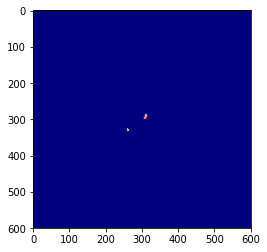

Image saved at:  060_2-295_2_slam slice_no_13.jpeg
14 out of 160 tiles(600, 600, 3)


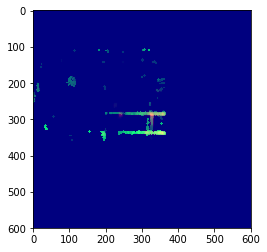

Image saved at:  060_2-295_2_slam slice_no_14.jpeg
15 out of 160 tiles(600, 600, 3)


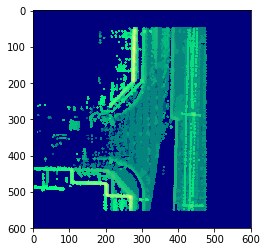

Image saved at:  060_2-295_2_slam slice_no_15.jpeg
16 out of 160 tiles(600, 600, 3)


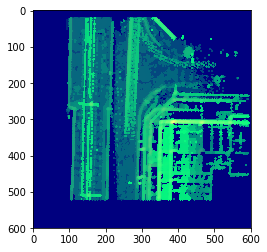

Image saved at:  060_2-295_2_slam slice_no_16.jpeg
17 out of 160 tiles(600, 600, 3)


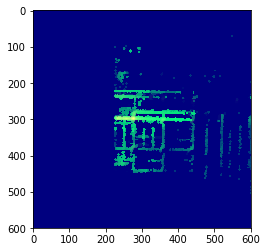

Image saved at:  060_2-295_2_slam slice_no_17.jpeg
18 out of 160 tiles(600, 600, 3)


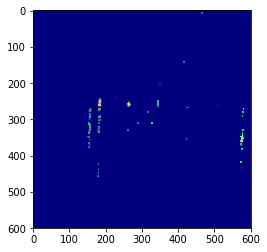

Image saved at:  060_2-295_2_slam slice_no_18.jpeg
19 out of 160 tiles(600, 600, 3)


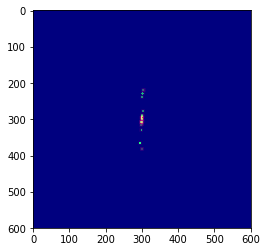

Image saved at:  060_2-295_2_slam slice_no_19.jpeg
20 out of 160 tiles(600, 600, 3)


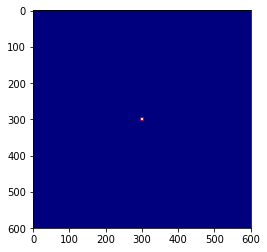

Image saved at:  060_2-295_2_slam slice_no_20.jpeg
23 out of 160 tiles(600, 600, 3)


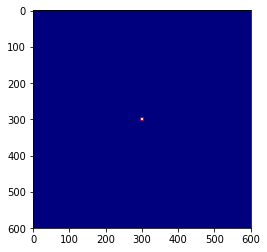

Image saved at:  060_2-295_2_slam slice_no_23.jpeg
24 out of 160 tiles(600, 600, 3)


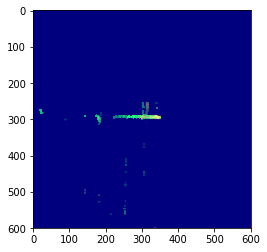

Image saved at:  060_2-295_2_slam slice_no_24.jpeg
25 out of 160 tiles(600, 600, 3)


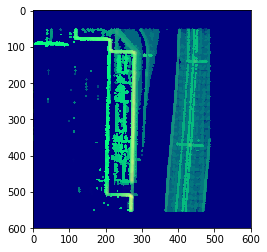

Image saved at:  060_2-295_2_slam slice_no_25.jpeg
26 out of 160 tiles(600, 600, 3)


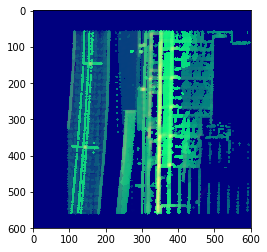

Image saved at:  060_2-295_2_slam slice_no_26.jpeg
27 out of 160 tiles(600, 600, 3)


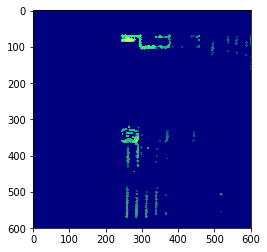

Image saved at:  060_2-295_2_slam slice_no_27.jpeg
28 out of 160 tiles(600, 600, 3)


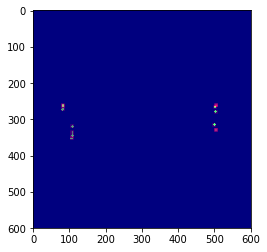

Image saved at:  060_2-295_2_slam slice_no_28.jpeg
29 out of 160 tiles(600, 600, 3)


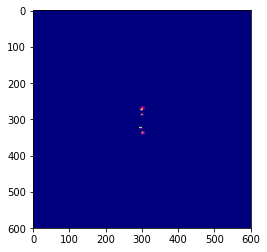

Image saved at:  060_2-295_2_slam slice_no_29.jpeg
33 out of 160 tiles(600, 600, 3)


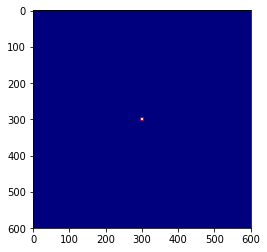

Image saved at:  060_2-295_2_slam slice_no_33.jpeg
34 out of 160 tiles(600, 600, 3)


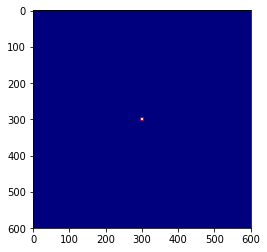

Image saved at:  060_2-295_2_slam slice_no_34.jpeg
35 out of 160 tiles(600, 600, 3)


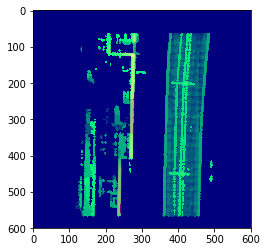

Image saved at:  060_2-295_2_slam slice_no_35.jpeg
36 out of 160 tiles(600, 600, 3)


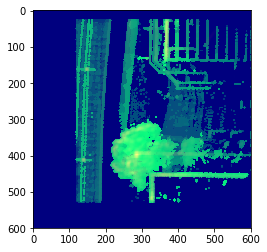

Image saved at:  060_2-295_2_slam slice_no_36.jpeg
37 out of 160 tiles(600, 600, 3)


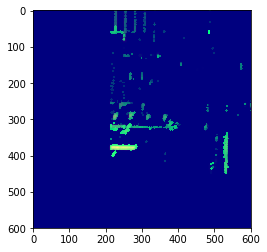

Image saved at:  060_2-295_2_slam slice_no_37.jpeg
38 out of 160 tiles(600, 600, 3)


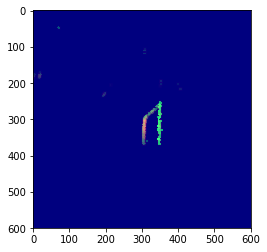

Image saved at:  060_2-295_2_slam slice_no_38.jpeg
39 out of 160 tiles(600, 600, 3)


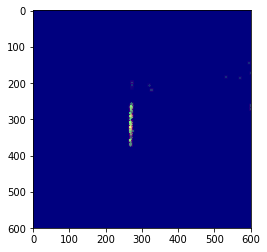

Image saved at:  060_2-295_2_slam slice_no_39.jpeg
40 out of 160 tiles(600, 600, 3)


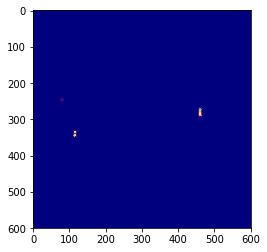

Image saved at:  060_2-295_2_slam slice_no_40.jpeg
44 out of 160 tiles(600, 600, 3)


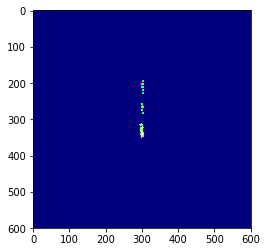

Image saved at:  060_2-295_2_slam slice_no_44.jpeg
45 out of 160 tiles(600, 600, 3)


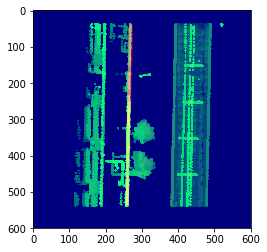

Image saved at:  060_2-295_2_slam slice_no_45.jpeg
46 out of 160 tiles(600, 600, 3)


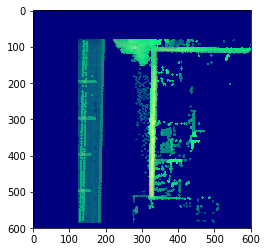

Image saved at:  060_2-295_2_slam slice_no_46.jpeg
47 out of 160 tiles(600, 600, 3)


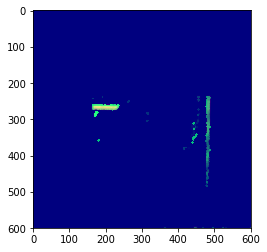

Image saved at:  060_2-295_2_slam slice_no_47.jpeg
48 out of 160 tiles(600, 600, 3)


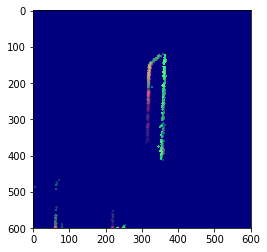

Image saved at:  060_2-295_2_slam slice_no_48.jpeg
49 out of 160 tiles(600, 600, 3)


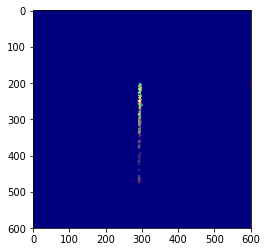

Image saved at:  060_2-295_2_slam slice_no_49.jpeg
50 out of 160 tiles(600, 600, 3)


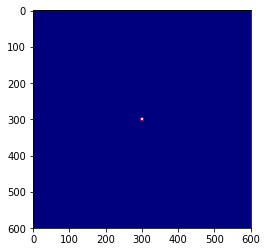

Image saved at:  060_2-295_2_slam slice_no_50.jpeg
52 out of 160 tiles(600, 600, 3)


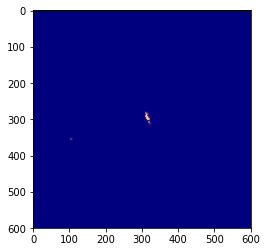

Image saved at:  060_2-295_2_slam slice_no_52.jpeg
53 out of 160 tiles(600, 600, 3)


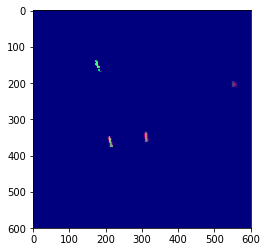

Image saved at:  060_2-295_2_slam slice_no_53.jpeg
54 out of 160 tiles(600, 600, 3)


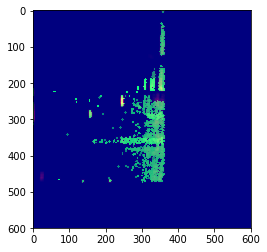

Image saved at:  060_2-295_2_slam slice_no_54.jpeg
55 out of 160 tiles(600, 600, 3)


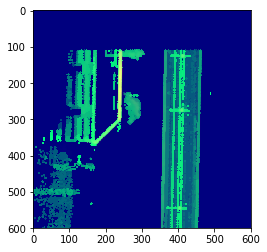

Image saved at:  060_2-295_2_slam slice_no_55.jpeg
56 out of 160 tiles(600, 600, 3)


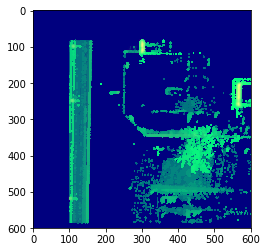

Image saved at:  060_2-295_2_slam slice_no_56.jpeg
57 out of 160 tiles(600, 600, 3)


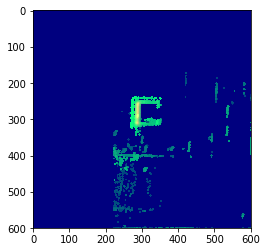

Image saved at:  060_2-295_2_slam slice_no_57.jpeg
58 out of 160 tiles(600, 600, 3)


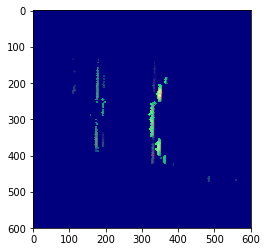

Image saved at:  060_2-295_2_slam slice_no_58.jpeg
59 out of 160 tiles(600, 600, 3)


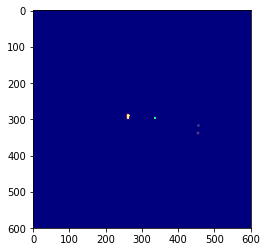

Image saved at:  060_2-295_2_slam slice_no_59.jpeg
60 out of 160 tiles(600, 600, 3)


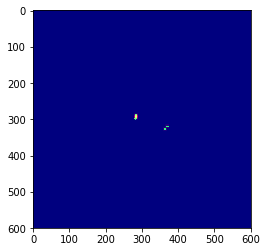

Image saved at:  060_2-295_2_slam slice_no_60.jpeg
61 out of 160 tiles(600, 600, 3)


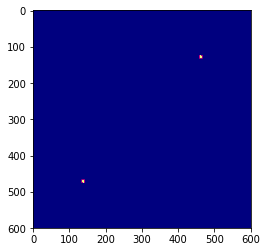

Image saved at:  060_2-295_2_slam slice_no_61.jpeg
62 out of 160 tiles(600, 600, 3)


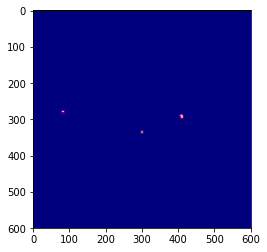

Image saved at:  060_2-295_2_slam slice_no_62.jpeg
63 out of 160 tiles(600, 600, 3)


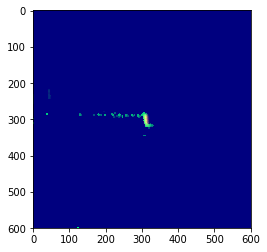

Image saved at:  060_2-295_2_slam slice_no_63.jpeg
64 out of 160 tiles(600, 600, 3)


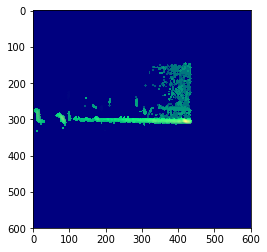

Image saved at:  060_2-295_2_slam slice_no_64.jpeg
65 out of 160 tiles(600, 600, 3)


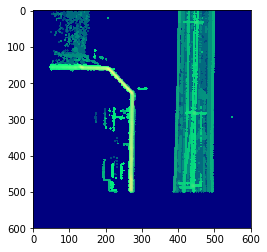

Image saved at:  060_2-295_2_slam slice_no_65.jpeg
66 out of 160 tiles(600, 600, 3)


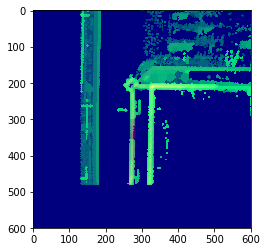

Image saved at:  060_2-295_2_slam slice_no_66.jpeg
67 out of 160 tiles(600, 600, 3)


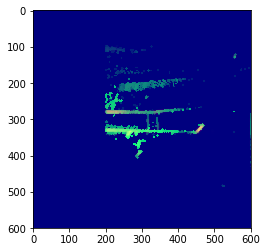

Image saved at:  060_2-295_2_slam slice_no_67.jpeg
68 out of 160 tiles(600, 600, 3)


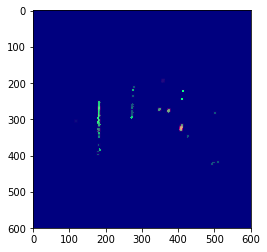

Image saved at:  060_2-295_2_slam slice_no_68.jpeg
69 out of 160 tiles(600, 600, 3)


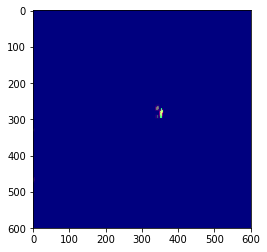

Image saved at:  060_2-295_2_slam slice_no_69.jpeg
70 out of 160 tiles(600, 600, 3)


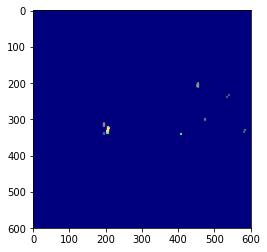

Image saved at:  060_2-295_2_slam slice_no_70.jpeg
71 out of 160 tiles(600, 600, 3)


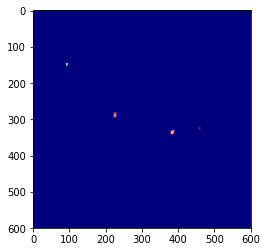

Image saved at:  060_2-295_2_slam slice_no_71.jpeg
72 out of 160 tiles(600, 600, 3)


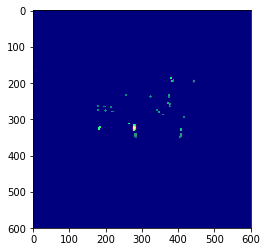

Image saved at:  060_2-295_2_slam slice_no_72.jpeg
73 out of 160 tiles(600, 600, 3)


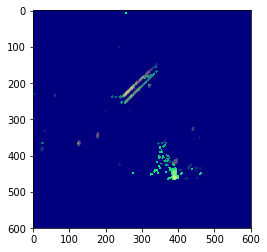

Image saved at:  060_2-295_2_slam slice_no_73.jpeg
74 out of 160 tiles(600, 600, 3)


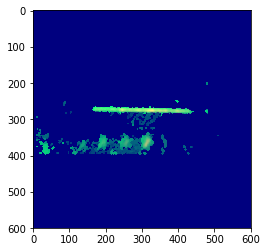

Image saved at:  060_2-295_2_slam slice_no_74.jpeg
75 out of 160 tiles(600, 600, 3)


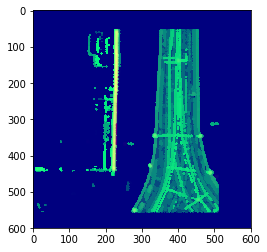

Image saved at:  060_2-295_2_slam slice_no_75.jpeg
76 out of 160 tiles(600, 600, 3)


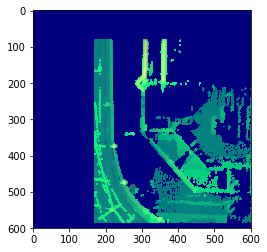

Image saved at:  060_2-295_2_slam slice_no_76.jpeg
77 out of 160 tiles(600, 600, 3)


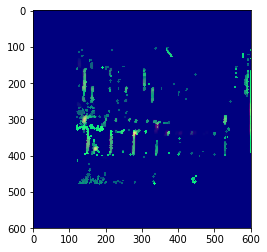

Image saved at:  060_2-295_2_slam slice_no_77.jpeg
78 out of 160 tiles(600, 600, 3)


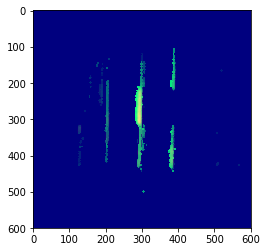

Image saved at:  060_2-295_2_slam slice_no_78.jpeg
79 out of 160 tiles(600, 600, 3)


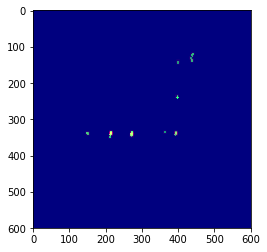

Image saved at:  060_2-295_2_slam slice_no_79.jpeg
81 out of 160 tiles(600, 600, 3)


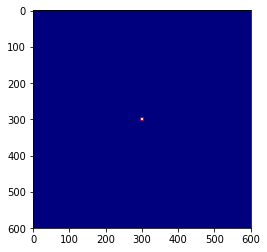

Image saved at:  060_2-295_2_slam slice_no_81.jpeg
82 out of 160 tiles(600, 600, 3)


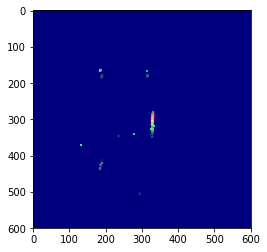

Image saved at:  060_2-295_2_slam slice_no_82.jpeg
83 out of 160 tiles(600, 600, 3)


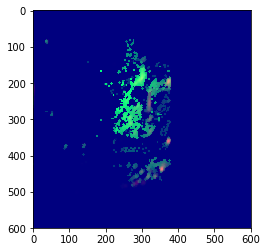

Image saved at:  060_2-295_2_slam slice_no_83.jpeg
84 out of 160 tiles(600, 600, 3)


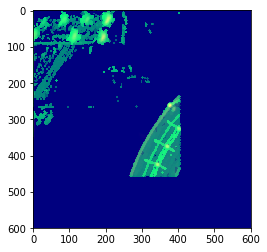

Image saved at:  060_2-295_2_slam slice_no_84.jpeg
85 out of 160 tiles(600, 600, 3)


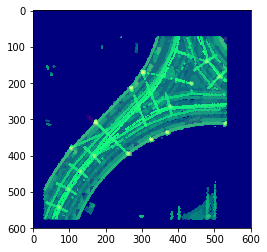

Image saved at:  060_2-295_2_slam slice_no_85.jpeg
86 out of 160 tiles(600, 600, 3)


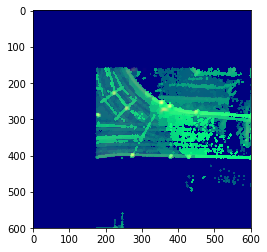

Image saved at:  060_2-295_2_slam slice_no_86.jpeg
87 out of 160 tiles(600, 600, 3)


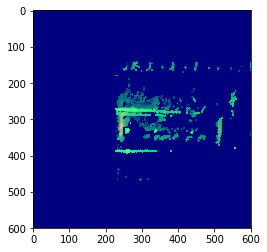

Image saved at:  060_2-295_2_slam slice_no_87.jpeg
88 out of 160 tiles(600, 600, 3)


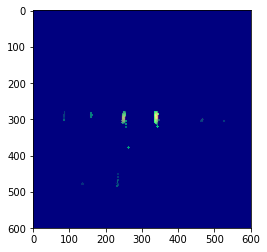

Image saved at:  060_2-295_2_slam slice_no_88.jpeg
89 out of 160 tiles(600, 600, 3)


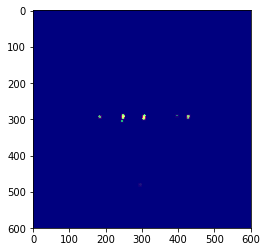

Image saved at:  060_2-295_2_slam slice_no_89.jpeg
90 out of 160 tiles(600, 600, 3)


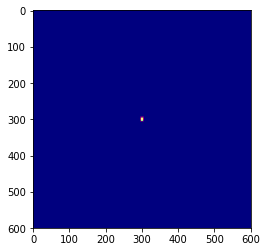

Image saved at:  060_2-295_2_slam slice_no_90.jpeg
93 out of 160 tiles(600, 600, 3)


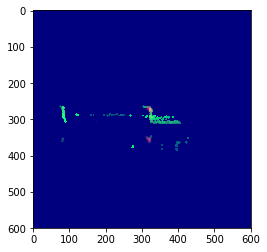

Image saved at:  060_2-295_2_slam slice_no_93.jpeg
94 out of 160 tiles(600, 600, 3)


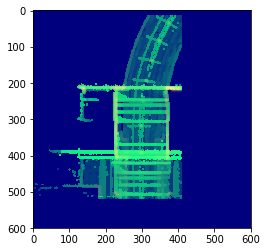

Image saved at:  060_2-295_2_slam slice_no_94.jpeg
95 out of 160 tiles(600, 600, 3)


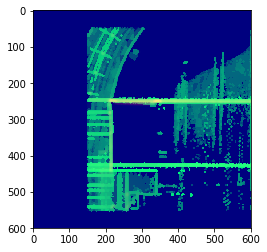

Image saved at:  060_2-295_2_slam slice_no_95.jpeg
96 out of 160 tiles(600, 600, 3)


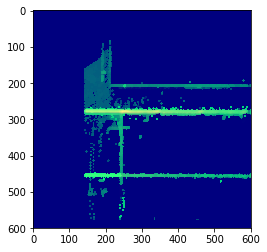

Image saved at:  060_2-295_2_slam slice_no_96.jpeg
97 out of 160 tiles(600, 600, 3)


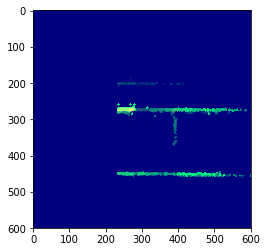

Image saved at:  060_2-295_2_slam slice_no_97.jpeg
98 out of 160 tiles(600, 600, 3)


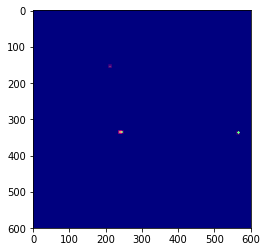

Image saved at:  060_2-295_2_slam slice_no_98.jpeg
99 out of 160 tiles(600, 600, 3)


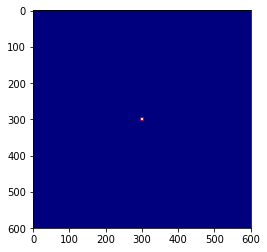

Image saved at:  060_2-295_2_slam slice_no_99.jpeg
102 out of 160 tiles(600, 600, 3)


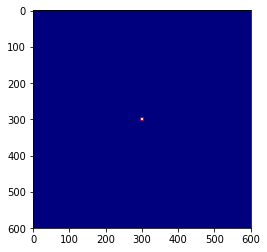

Image saved at:  060_2-295_2_slam slice_no_102.jpeg
103 out of 160 tiles(600, 600, 3)


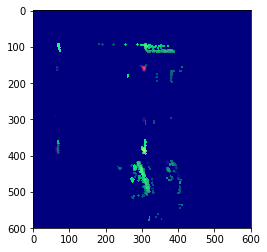

Image saved at:  060_2-295_2_slam slice_no_103.jpeg
104 out of 160 tiles(600, 600, 3)


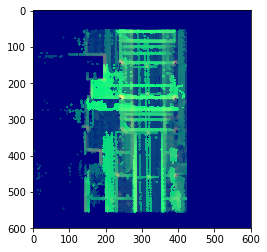

Image saved at:  060_2-295_2_slam slice_no_104.jpeg
105 out of 160 tiles(600, 600, 3)


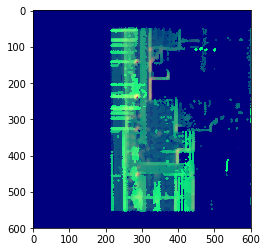

Image saved at:  060_2-295_2_slam slice_no_105.jpeg
106 out of 160 tiles(600, 600, 3)


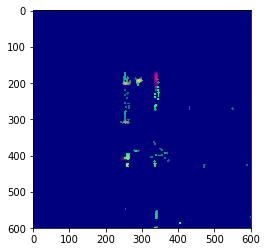

Image saved at:  060_2-295_2_slam slice_no_106.jpeg
108 out of 160 tiles(600, 600, 3)


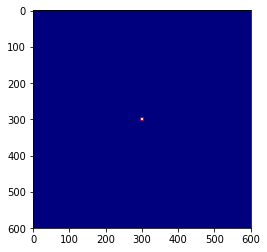

Image saved at:  060_2-295_2_slam slice_no_108.jpeg
112 out of 160 tiles(600, 600, 3)


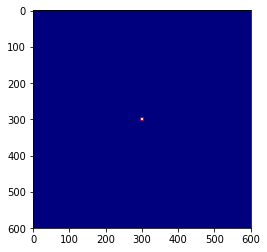

Image saved at:  060_2-295_2_slam slice_no_112.jpeg
113 out of 160 tiles(600, 600, 3)


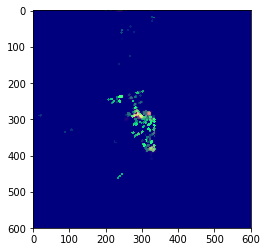

Image saved at:  060_2-295_2_slam slice_no_113.jpeg
114 out of 160 tiles(600, 600, 3)


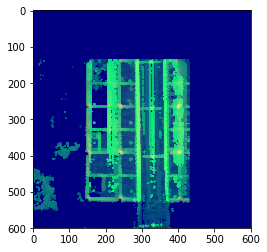

Image saved at:  060_2-295_2_slam slice_no_114.jpeg
115 out of 160 tiles(600, 600, 3)


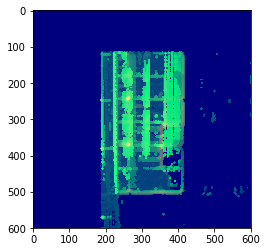

Image saved at:  060_2-295_2_slam slice_no_115.jpeg
116 out of 160 tiles(600, 600, 3)


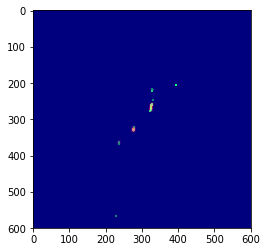

Image saved at:  060_2-295_2_slam slice_no_116.jpeg
118 out of 160 tiles(600, 600, 3)


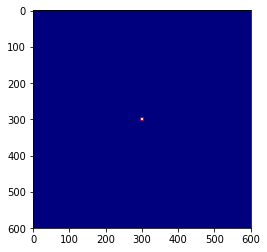

Image saved at:  060_2-295_2_slam slice_no_118.jpeg
123 out of 160 tiles(600, 600, 3)


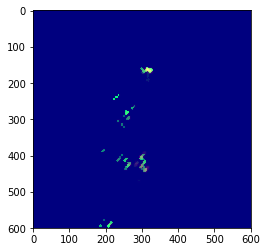

Image saved at:  060_2-295_2_slam slice_no_123.jpeg
124 out of 160 tiles(600, 600, 3)


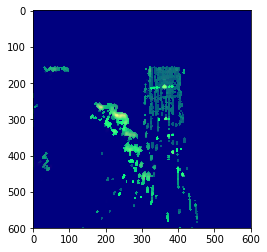

Image saved at:  060_2-295_2_slam slice_no_124.jpeg
125 out of 160 tiles(600, 600, 3)


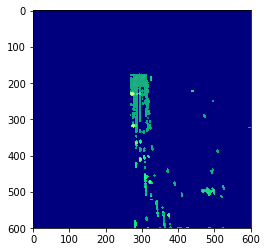

Image saved at:  060_2-295_2_slam slice_no_125.jpeg
133 out of 160 tiles(600, 600, 3)


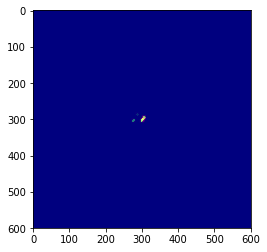

Image saved at:  060_2-295_2_slam slice_no_133.jpeg
134 out of 160 tiles(600, 600, 3)


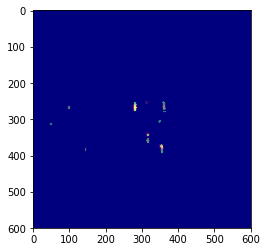

Image saved at:  060_2-295_2_slam slice_no_134.jpeg
135 out of 160 tiles(600, 600, 3)


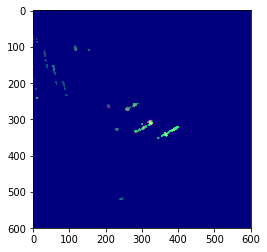

Image saved at:  060_2-295_2_slam slice_no_135.jpeg
136 out of 160 tiles(600, 600, 3)


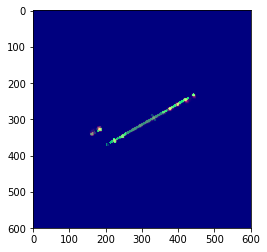

Image saved at:  060_2-295_2_slam slice_no_136.jpeg
145 out of 160 tiles(600, 600, 3)


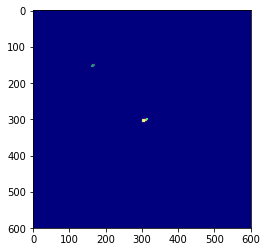

Image saved at:  060_2-295_2_slam slice_no_145.jpeg
146 out of 160 tiles(600, 600, 3)


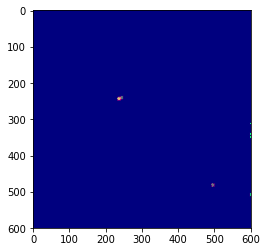

Image saved at:  060_2-295_2_slam slice_no_146.jpeg
147 out of 160 tiles(600, 600, 3)


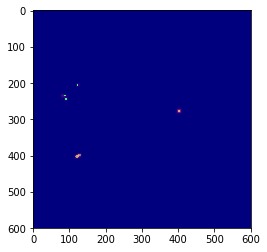

Image saved at:  060_2-295_2_slam slice_no_147.jpeg
148 out of 160 tiles(600, 600, 3)


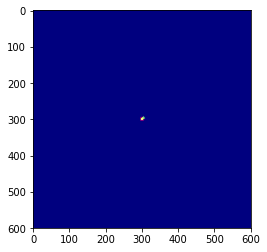

Image saved at:  060_2-295_2_slam slice_no_148.jpeg
156 out of 160 tiles(600, 600, 3)


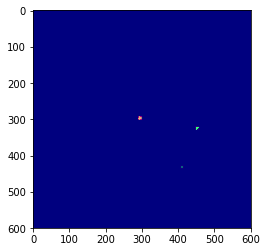

Image saved at:  060_2-295_2_slam slice_no_156.jpeg
157 out of 160 tiles(600, 600, 3)


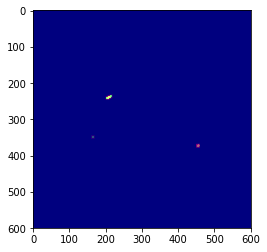

Image saved at:  060_2-295_2_slam slice_no_157.jpeg
158 out of 160 tiles(600, 600, 3)


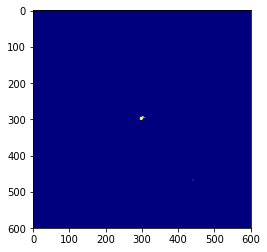

Image saved at:  060_2-295_2_slam slice_no_158.jpeg
160 out of 160 tilesReading File:  170_2-200_2_slam.pcd  From Path:  ../../data/pcd_files/
2 out of 144 tiles(600, 600, 3)


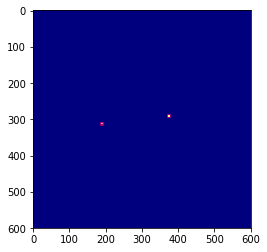

Image saved at:  170_2-200_2_slam slice_no_2.jpeg
3 out of 144 tiles(600, 600, 3)


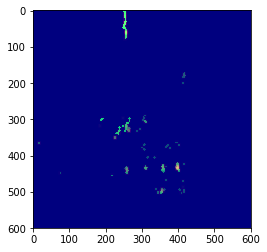

Image saved at:  170_2-200_2_slam slice_no_3.jpeg
4 out of 144 tiles(600, 600, 3)


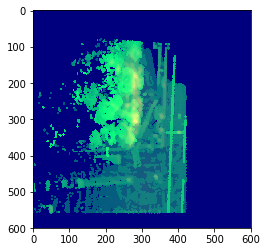

Image saved at:  170_2-200_2_slam slice_no_4.jpeg
5 out of 144 tiles(600, 600, 3)


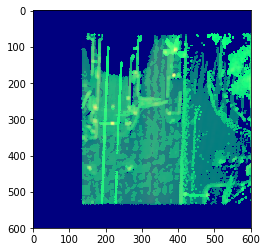

Image saved at:  170_2-200_2_slam slice_no_5.jpeg
6 out of 144 tiles(600, 600, 3)


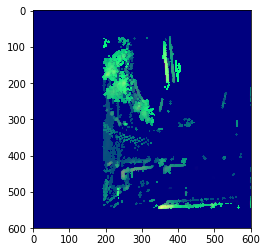

Image saved at:  170_2-200_2_slam slice_no_6.jpeg
7 out of 144 tiles(600, 600, 3)


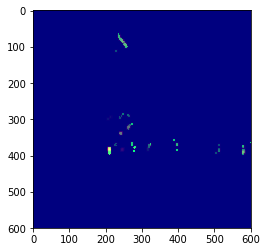

Image saved at:  170_2-200_2_slam slice_no_7.jpeg
8 out of 144 tiles(600, 600, 3)


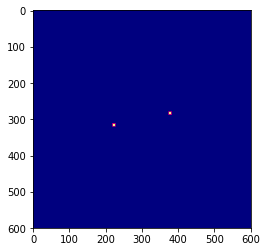

Image saved at:  170_2-200_2_slam slice_no_8.jpeg
9 out of 144 tiles(600, 600, 3)


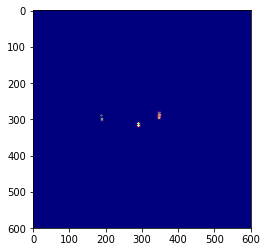

Image saved at:  170_2-200_2_slam slice_no_9.jpeg
10 out of 144 tiles(600, 600, 3)


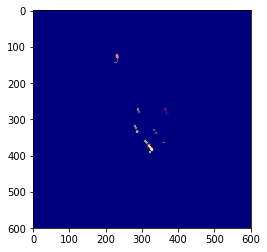

Image saved at:  170_2-200_2_slam slice_no_10.jpeg
11 out of 144 tiles(600, 600, 3)


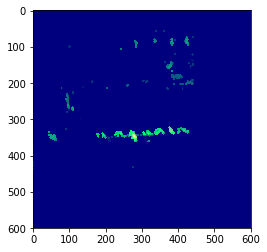

Image saved at:  170_2-200_2_slam slice_no_11.jpeg
12 out of 144 tiles(600, 600, 3)


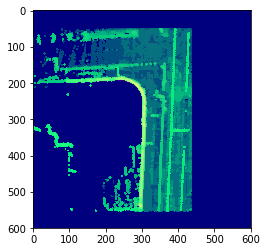

Image saved at:  170_2-200_2_slam slice_no_12.jpeg
13 out of 144 tiles(600, 600, 3)


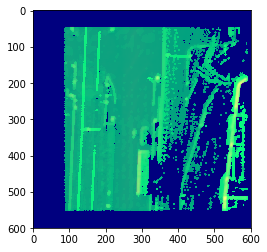

Image saved at:  170_2-200_2_slam slice_no_13.jpeg
14 out of 144 tiles(600, 600, 3)


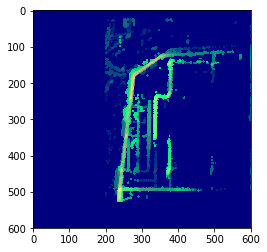

Image saved at:  170_2-200_2_slam slice_no_14.jpeg
15 out of 144 tiles(600, 600, 3)


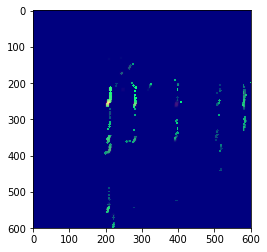

Image saved at:  170_2-200_2_slam slice_no_15.jpeg
16 out of 144 tiles(600, 600, 3)


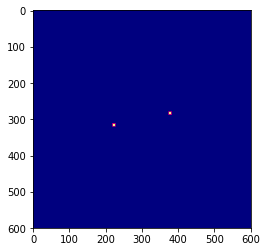

Image saved at:  170_2-200_2_slam slice_no_16.jpeg
18 out of 144 tiles(600, 600, 3)


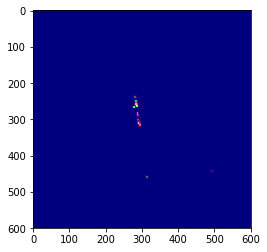

Image saved at:  170_2-200_2_slam slice_no_18.jpeg
19 out of 144 tiles(600, 600, 3)


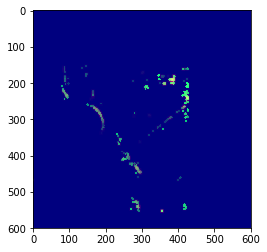

Image saved at:  170_2-200_2_slam slice_no_19.jpeg
20 out of 144 tiles(600, 600, 3)


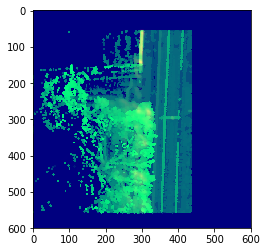

Image saved at:  170_2-200_2_slam slice_no_20.jpeg
21 out of 144 tiles(600, 600, 3)


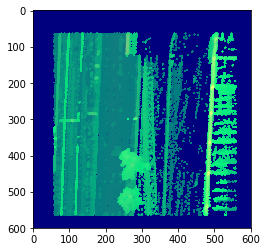

Image saved at:  170_2-200_2_slam slice_no_21.jpeg
22 out of 144 tiles(600, 600, 3)


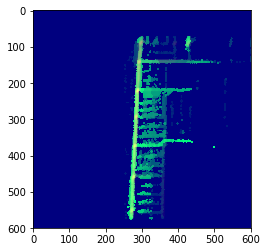

Image saved at:  170_2-200_2_slam slice_no_22.jpeg
23 out of 144 tiles(600, 600, 3)


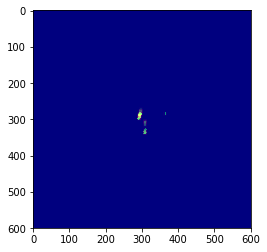

Image saved at:  170_2-200_2_slam slice_no_23.jpeg
26 out of 144 tiles(600, 600, 3)


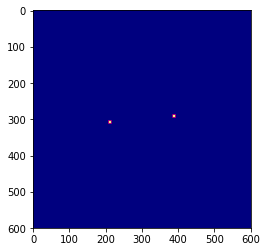

Image saved at:  170_2-200_2_slam slice_no_26.jpeg
27 out of 144 tiles(600, 600, 3)


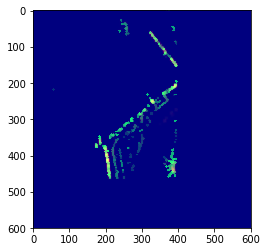

Image saved at:  170_2-200_2_slam slice_no_27.jpeg
28 out of 144 tiles(600, 600, 3)


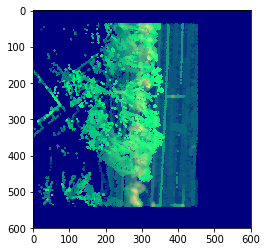

Image saved at:  170_2-200_2_slam slice_no_28.jpeg
29 out of 144 tiles(600, 600, 3)


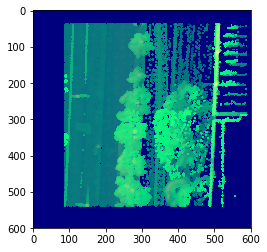

Image saved at:  170_2-200_2_slam slice_no_29.jpeg
30 out of 144 tiles(600, 600, 3)


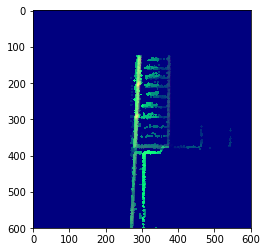

Image saved at:  170_2-200_2_slam slice_no_30.jpeg
34 out of 144 tiles(600, 600, 3)


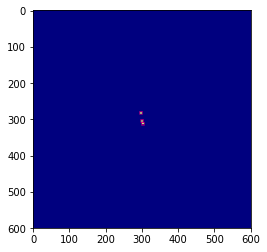

Image saved at:  170_2-200_2_slam slice_no_34.jpeg
35 out of 144 tiles(600, 600, 3)


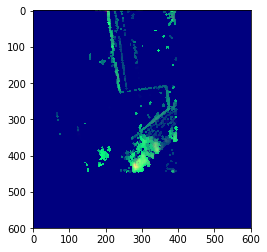

Image saved at:  170_2-200_2_slam slice_no_35.jpeg
36 out of 144 tiles(600, 600, 3)


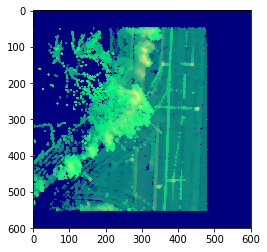

Image saved at:  170_2-200_2_slam slice_no_36.jpeg
37 out of 144 tiles(600, 600, 3)


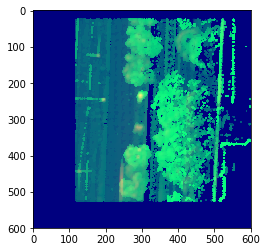

Image saved at:  170_2-200_2_slam slice_no_37.jpeg
38 out of 144 tiles(600, 600, 3)


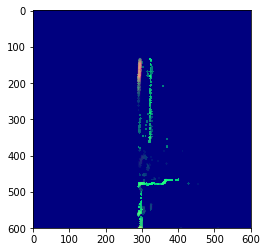

Image saved at:  170_2-200_2_slam slice_no_38.jpeg
42 out of 144 tiles(600, 600, 3)


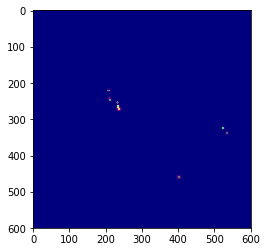

Image saved at:  170_2-200_2_slam slice_no_42.jpeg
43 out of 144 tiles(600, 600, 3)


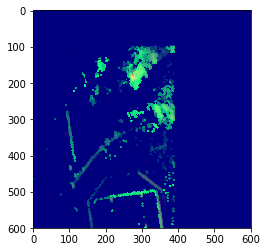

Image saved at:  170_2-200_2_slam slice_no_43.jpeg
44 out of 144 tiles(600, 600, 3)


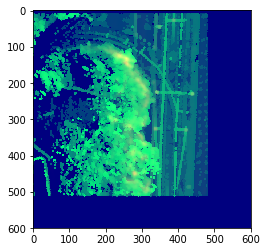

Image saved at:  170_2-200_2_slam slice_no_44.jpeg
45 out of 144 tiles(600, 600, 3)


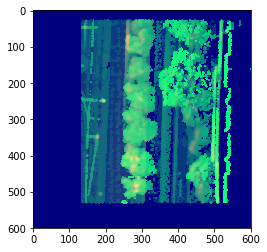

Image saved at:  170_2-200_2_slam slice_no_45.jpeg
46 out of 144 tiles(600, 600, 3)


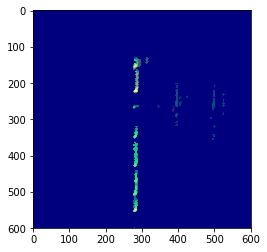

Image saved at:  170_2-200_2_slam slice_no_46.jpeg
50 out of 144 tiles(600, 600, 3)


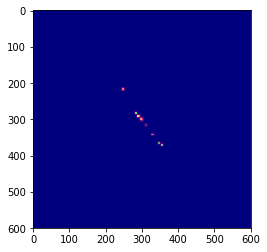

Image saved at:  170_2-200_2_slam slice_no_50.jpeg
51 out of 144 tiles(600, 600, 3)


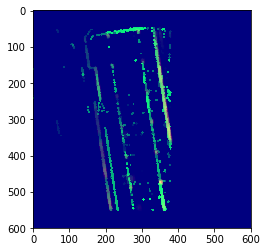

Image saved at:  170_2-200_2_slam slice_no_51.jpeg
52 out of 144 tiles(600, 600, 3)


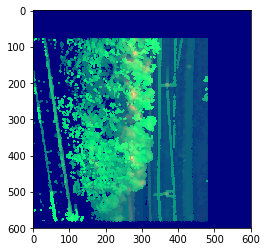

Image saved at:  170_2-200_2_slam slice_no_52.jpeg
53 out of 144 tiles(600, 600, 3)


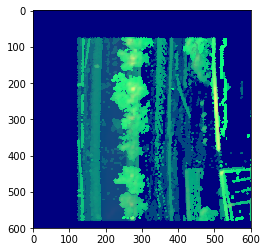

Image saved at:  170_2-200_2_slam slice_no_53.jpeg
54 out of 144 tiles(600, 600, 3)


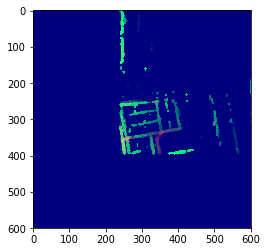

Image saved at:  170_2-200_2_slam slice_no_54.jpeg
55 out of 144 tiles(600, 600, 3)


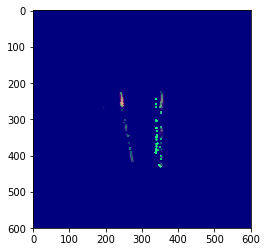

Image saved at:  170_2-200_2_slam slice_no_55.jpeg
58 out of 144 tiles(600, 600, 3)


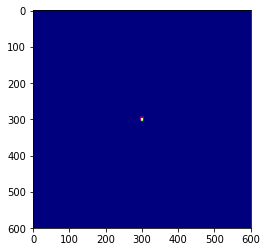

Image saved at:  170_2-200_2_slam slice_no_58.jpeg
59 out of 144 tiles(600, 600, 3)


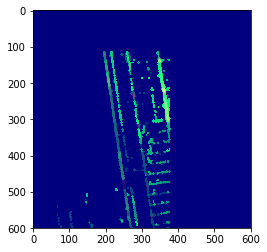

Image saved at:  170_2-200_2_slam slice_no_59.jpeg
60 out of 144 tiles(600, 600, 3)


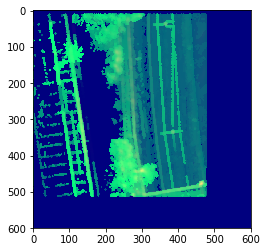

Image saved at:  170_2-200_2_slam slice_no_60.jpeg
61 out of 144 tiles(600, 600, 3)


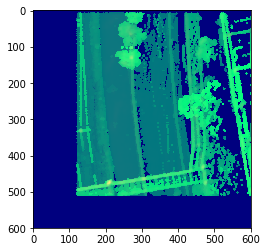

Image saved at:  170_2-200_2_slam slice_no_61.jpeg
62 out of 144 tiles(600, 600, 3)


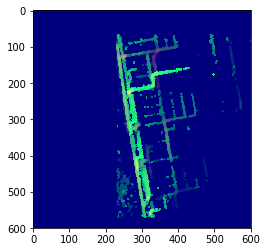

Image saved at:  170_2-200_2_slam slice_no_62.jpeg
63 out of 144 tiles(600, 600, 3)


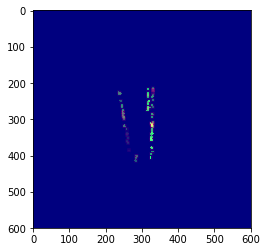

Image saved at:  170_2-200_2_slam slice_no_63.jpeg
66 out of 144 tiles(600, 600, 3)


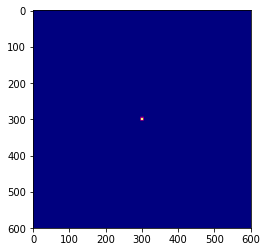

Image saved at:  170_2-200_2_slam slice_no_66.jpeg
67 out of 144 tiles(600, 600, 3)


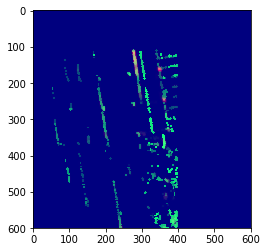

Image saved at:  170_2-200_2_slam slice_no_67.jpeg
68 out of 144 tiles(600, 600, 3)


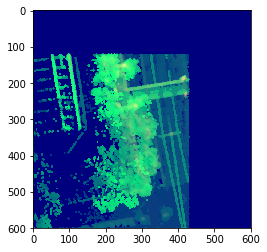

Image saved at:  170_2-200_2_slam slice_no_68.jpeg
69 out of 144 tiles(600, 600, 3)


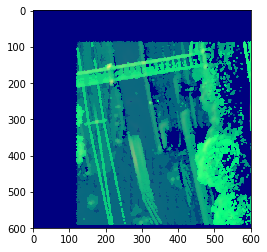

Image saved at:  170_2-200_2_slam slice_no_69.jpeg
70 out of 144 tiles(600, 600, 3)


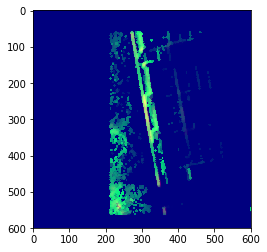

Image saved at:  170_2-200_2_slam slice_no_70.jpeg
71 out of 144 tiles(600, 600, 3)


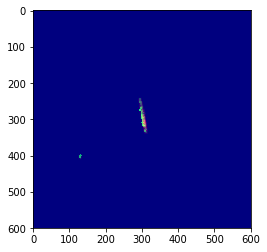

Image saved at:  170_2-200_2_slam slice_no_71.jpeg
74 out of 144 tiles(600, 600, 3)


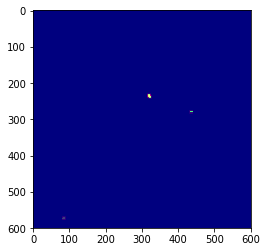

Image saved at:  170_2-200_2_slam slice_no_74.jpeg
75 out of 144 tiles(600, 600, 3)


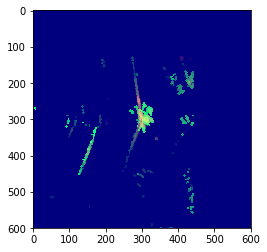

Image saved at:  170_2-200_2_slam slice_no_75.jpeg
76 out of 144 tiles(600, 600, 3)


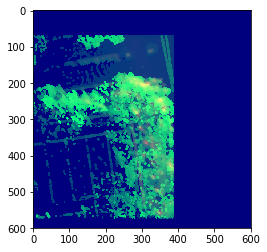

Image saved at:  170_2-200_2_slam slice_no_76.jpeg
77 out of 144 tiles(600, 600, 3)


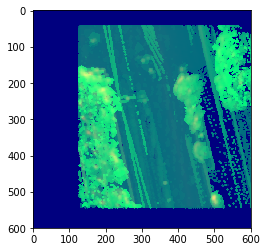

Image saved at:  170_2-200_2_slam slice_no_77.jpeg
78 out of 144 tiles(600, 600, 3)


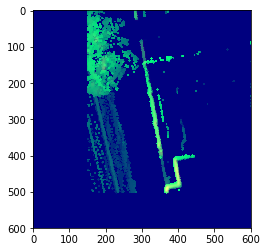

Image saved at:  170_2-200_2_slam slice_no_78.jpeg
79 out of 144 tiles(600, 600, 3)


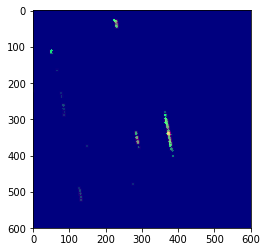

Image saved at:  170_2-200_2_slam slice_no_79.jpeg
82 out of 144 tiles(600, 600, 3)


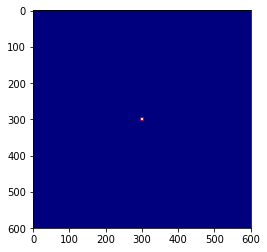

Image saved at:  170_2-200_2_slam slice_no_82.jpeg
83 out of 144 tiles(600, 600, 3)


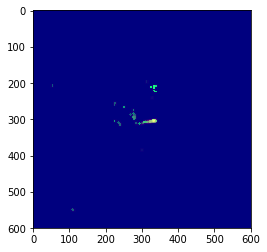

Image saved at:  170_2-200_2_slam slice_no_83.jpeg
84 out of 144 tiles(600, 600, 3)


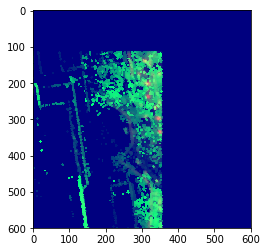

Image saved at:  170_2-200_2_slam slice_no_84.jpeg
85 out of 144 tiles(600, 600, 3)


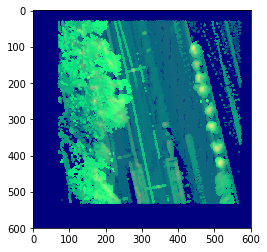

Image saved at:  170_2-200_2_slam slice_no_85.jpeg
86 out of 144 tiles(600, 600, 3)


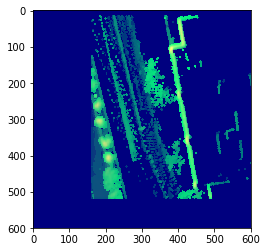

Image saved at:  170_2-200_2_slam slice_no_86.jpeg
87 out of 144 tiles(600, 600, 3)


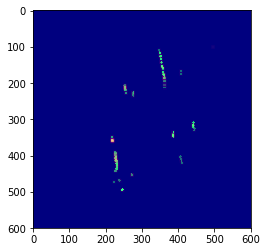

Image saved at:  170_2-200_2_slam slice_no_87.jpeg
91 out of 144 tiles(600, 600, 3)


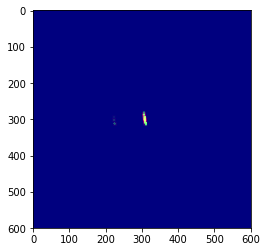

Image saved at:  170_2-200_2_slam slice_no_91.jpeg
92 out of 144 tiles(600, 600, 3)


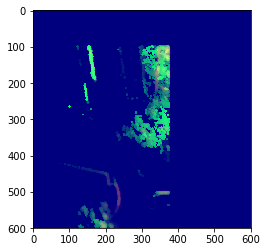

Image saved at:  170_2-200_2_slam slice_no_92.jpeg
93 out of 144 tiles(600, 600, 3)


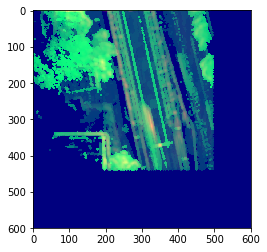

Image saved at:  170_2-200_2_slam slice_no_93.jpeg
94 out of 144 tiles(600, 600, 3)


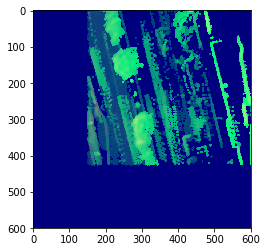

Image saved at:  170_2-200_2_slam slice_no_94.jpeg
95 out of 144 tiles(600, 600, 3)


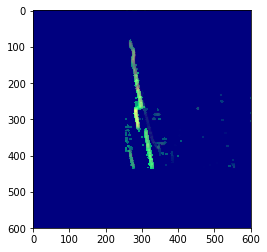

Image saved at:  170_2-200_2_slam slice_no_95.jpeg
96 out of 144 tiles(600, 600, 3)


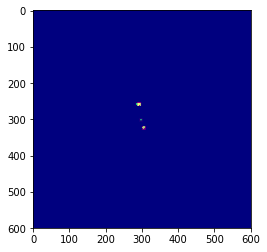

Image saved at:  170_2-200_2_slam slice_no_96.jpeg
99 out of 144 tiles(600, 600, 3)


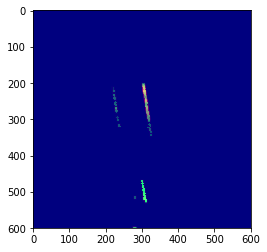

Image saved at:  170_2-200_2_slam slice_no_99.jpeg
100 out of 144 tiles(600, 600, 3)


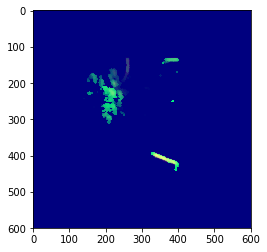

Image saved at:  170_2-200_2_slam slice_no_100.jpeg
101 out of 144 tiles(600, 600, 3)


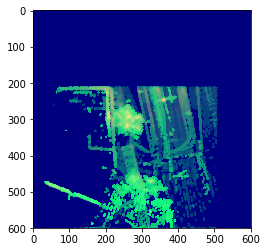

Image saved at:  170_2-200_2_slam slice_no_101.jpeg
102 out of 144 tiles(600, 600, 3)


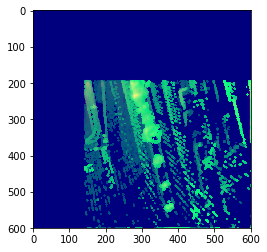

Image saved at:  170_2-200_2_slam slice_no_102.jpeg
103 out of 144 tiles(600, 600, 3)


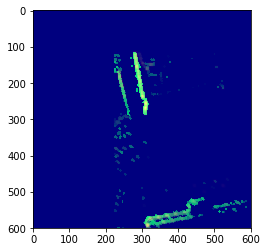

Image saved at:  170_2-200_2_slam slice_no_103.jpeg
104 out of 144 tiles(600, 600, 3)


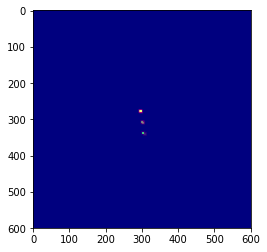

Image saved at:  170_2-200_2_slam slice_no_104.jpeg
107 out of 144 tiles(600, 600, 3)


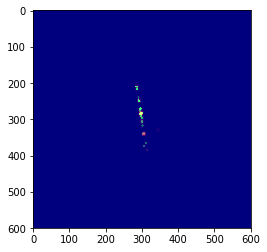

Image saved at:  170_2-200_2_slam slice_no_107.jpeg
108 out of 144 tiles(600, 600, 3)


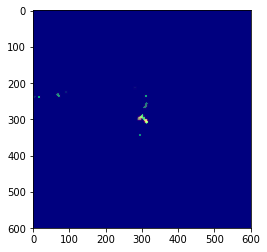

Image saved at:  170_2-200_2_slam slice_no_108.jpeg
109 out of 144 tiles(600, 600, 3)


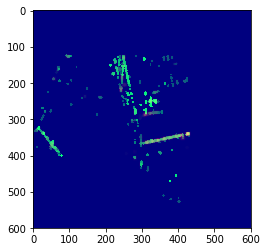

Image saved at:  170_2-200_2_slam slice_no_109.jpeg
110 out of 144 tiles(600, 600, 3)


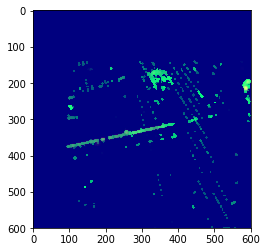

Image saved at:  170_2-200_2_slam slice_no_110.jpeg
111 out of 144 tiles(600, 600, 3)


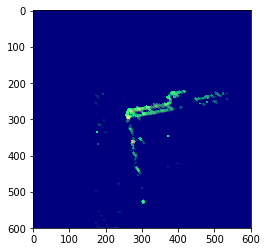

Image saved at:  170_2-200_2_slam slice_no_111.jpeg
112 out of 144 tiles(600, 600, 3)


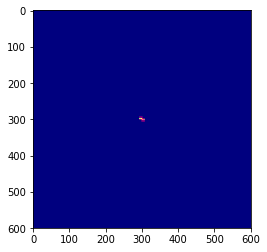

Image saved at:  170_2-200_2_slam slice_no_112.jpeg
115 out of 144 tiles(600, 600, 3)


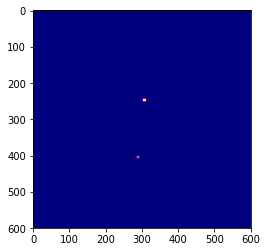

Image saved at:  170_2-200_2_slam slice_no_115.jpeg
116 out of 144 tiles(600, 600, 3)


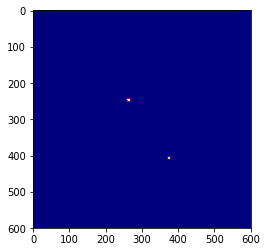

Image saved at:  170_2-200_2_slam slice_no_116.jpeg
117 out of 144 tiles(600, 600, 3)


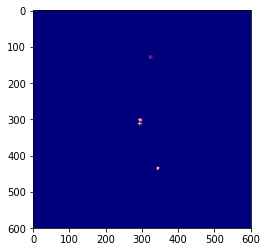

Image saved at:  170_2-200_2_slam slice_no_117.jpeg
118 out of 144 tiles(600, 600, 3)


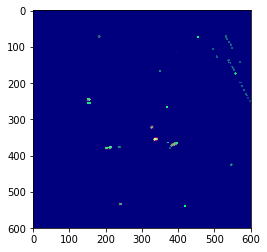

Image saved at:  170_2-200_2_slam slice_no_118.jpeg
119 out of 144 tiles(600, 600, 3)


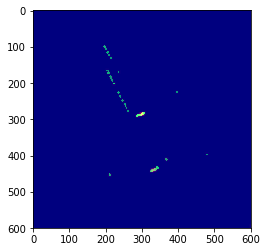

Image saved at:  170_2-200_2_slam slice_no_119.jpeg
120 out of 144 tiles(600, 600, 3)


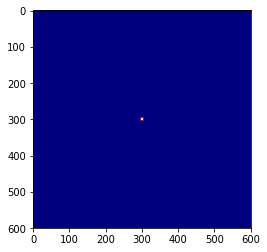

Image saved at:  170_2-200_2_slam slice_no_120.jpeg
123 out of 144 tiles(600, 600, 3)


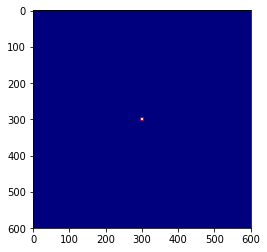

Image saved at:  170_2-200_2_slam slice_no_123.jpeg
124 out of 144 tiles(600, 600, 3)


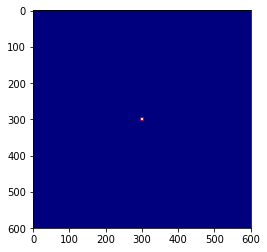

Image saved at:  170_2-200_2_slam slice_no_124.jpeg
126 out of 144 tiles(600, 600, 3)


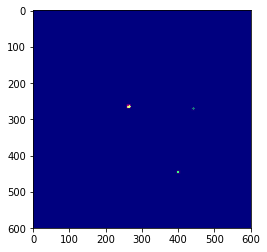

Image saved at:  170_2-200_2_slam slice_no_126.jpeg
127 out of 144 tiles(600, 600, 3)


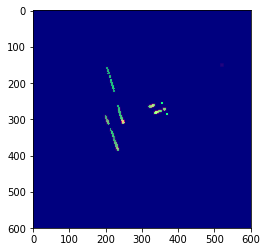

Image saved at:  170_2-200_2_slam slice_no_127.jpeg
128 out of 144 tiles(600, 600, 3)


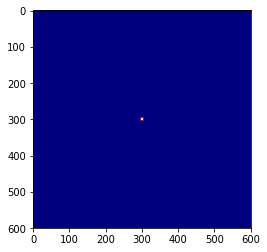

Image saved at:  170_2-200_2_slam slice_no_128.jpeg
134 out of 144 tiles(600, 600, 3)


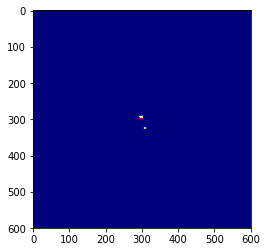

Image saved at:  170_2-200_2_slam slice_no_134.jpeg
135 out of 144 tiles(600, 600, 3)


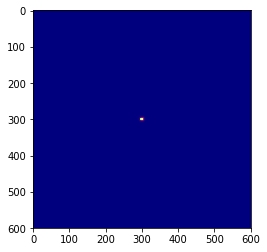

Image saved at:  170_2-200_2_slam slice_no_135.jpeg
143 out of 144 tiles(600, 600, 3)


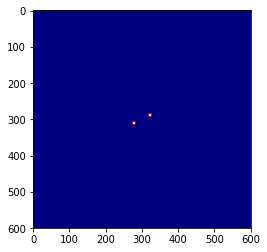

Image saved at:  170_2-200_2_slam slice_no_143.jpeg
144 out of 144 tilesReading File:  150_2-160_2_slam.pcd  From Path:  ../../data/pcd_files/
5 out of 117 tiles(600, 600, 3)


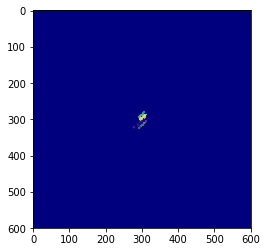

Image saved at:  150_2-160_2_slam slice_no_5.jpeg
6 out of 117 tiles(600, 600, 3)


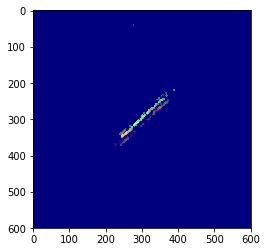

Image saved at:  150_2-160_2_slam slice_no_6.jpeg
7 out of 117 tiles(600, 600, 3)


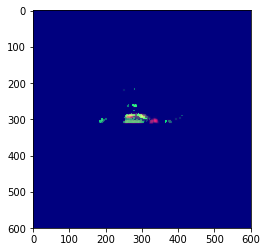

Image saved at:  150_2-160_2_slam slice_no_7.jpeg
8 out of 117 tiles(600, 600, 3)


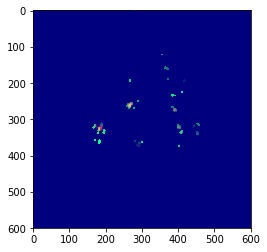

Image saved at:  150_2-160_2_slam slice_no_8.jpeg
9 out of 117 tiles(600, 600, 3)


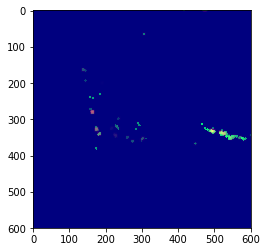

Image saved at:  150_2-160_2_slam slice_no_9.jpeg
10 out of 117 tiles(600, 600, 3)


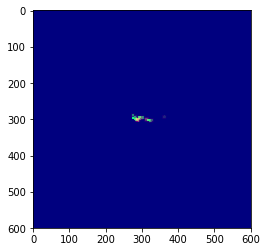

Image saved at:  150_2-160_2_slam slice_no_10.jpeg
11 out of 117 tiles(600, 600, 3)


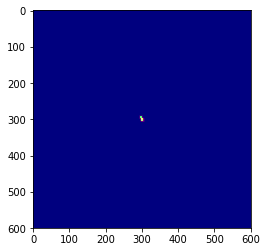

Image saved at:  150_2-160_2_slam slice_no_11.jpeg
12 out of 117 tiles(600, 600, 3)


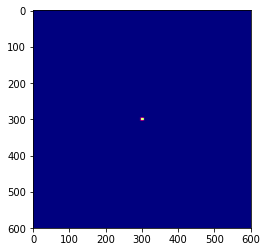

Image saved at:  150_2-160_2_slam slice_no_12.jpeg
15 out of 117 tiles(600, 600, 3)


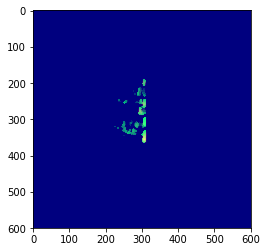

Image saved at:  150_2-160_2_slam slice_no_15.jpeg
16 out of 117 tiles(600, 600, 3)


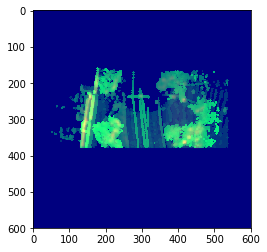

Image saved at:  150_2-160_2_slam slice_no_16.jpeg
17 out of 117 tiles(600, 600, 3)


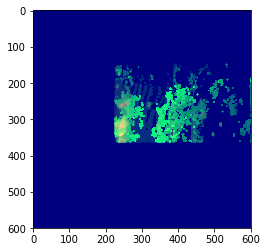

Image saved at:  150_2-160_2_slam slice_no_17.jpeg
18 out of 117 tiles(600, 600, 3)


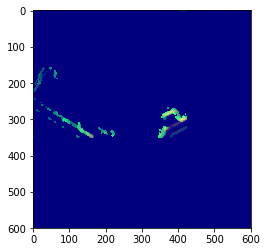

Image saved at:  150_2-160_2_slam slice_no_18.jpeg
19 out of 117 tiles(600, 600, 3)


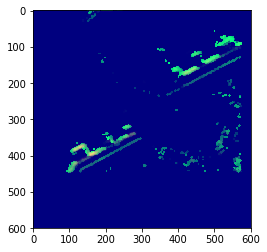

Image saved at:  150_2-160_2_slam slice_no_19.jpeg
20 out of 117 tiles(600, 600, 3)


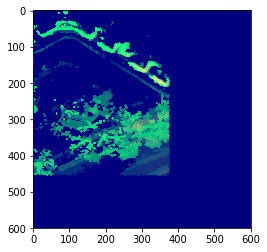

Image saved at:  150_2-160_2_slam slice_no_20.jpeg
21 out of 117 tiles(600, 600, 3)


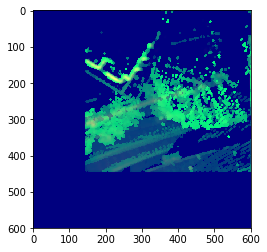

Image saved at:  150_2-160_2_slam slice_no_21.jpeg
22 out of 117 tiles(600, 600, 3)


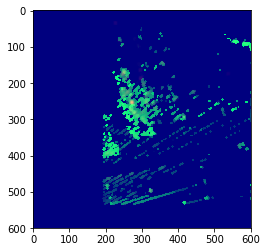

Image saved at:  150_2-160_2_slam slice_no_22.jpeg
23 out of 117 tiles(600, 600, 3)


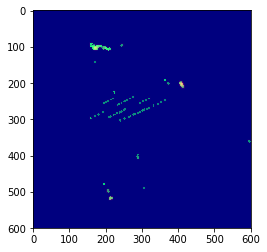

Image saved at:  150_2-160_2_slam slice_no_23.jpeg
24 out of 117 tiles(600, 600, 3)


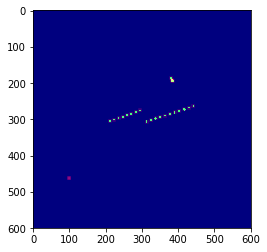

Image saved at:  150_2-160_2_slam slice_no_24.jpeg
25 out of 117 tiles(600, 600, 3)


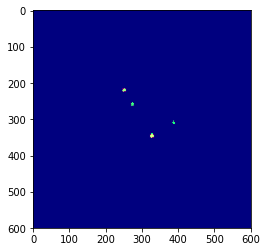

Image saved at:  150_2-160_2_slam slice_no_25.jpeg
26 out of 117 tiles(600, 600, 3)


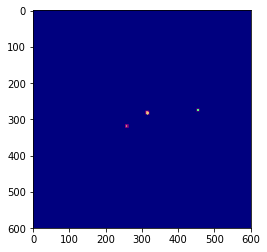

Image saved at:  150_2-160_2_slam slice_no_26.jpeg
28 out of 117 tiles(600, 600, 3)


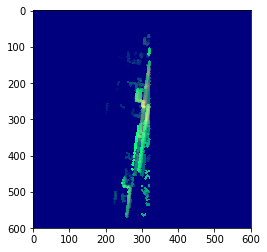

Image saved at:  150_2-160_2_slam slice_no_28.jpeg
29 out of 117 tiles(600, 600, 3)


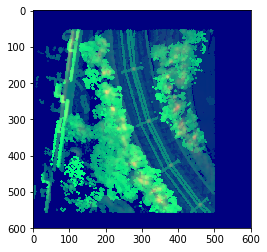

Image saved at:  150_2-160_2_slam slice_no_29.jpeg
30 out of 117 tiles(600, 600, 3)


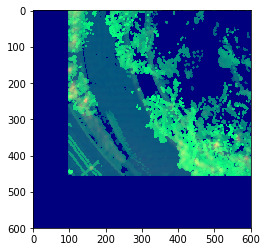

Image saved at:  150_2-160_2_slam slice_no_30.jpeg
31 out of 117 tiles(600, 600, 3)


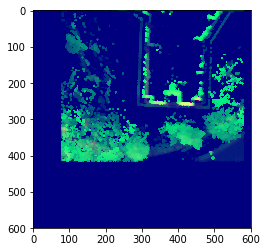

Image saved at:  150_2-160_2_slam slice_no_31.jpeg
32 out of 117 tiles(600, 600, 3)


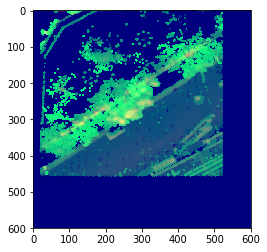

Image saved at:  150_2-160_2_slam slice_no_32.jpeg
33 out of 117 tiles(600, 600, 3)


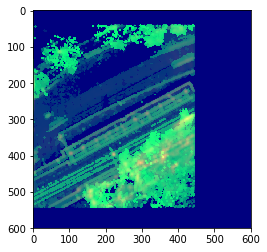

Image saved at:  150_2-160_2_slam slice_no_33.jpeg
34 out of 117 tiles(600, 600, 3)


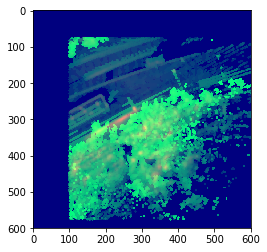

Image saved at:  150_2-160_2_slam slice_no_34.jpeg
35 out of 117 tiles(600, 600, 3)


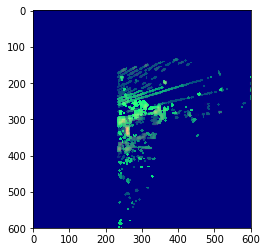

Image saved at:  150_2-160_2_slam slice_no_35.jpeg
36 out of 117 tiles(600, 600, 3)


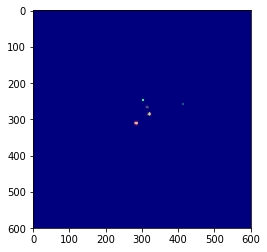

Image saved at:  150_2-160_2_slam slice_no_36.jpeg
41 out of 117 tiles(600, 600, 3)


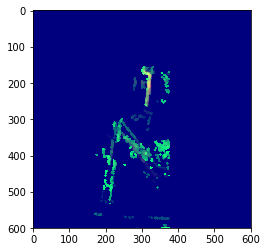

Image saved at:  150_2-160_2_slam slice_no_41.jpeg
42 out of 117 tiles(600, 600, 3)


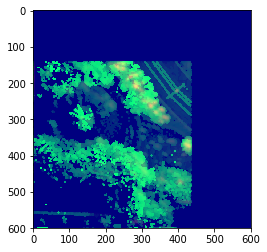

Image saved at:  150_2-160_2_slam slice_no_42.jpeg
43 out of 117 tiles(600, 600, 3)


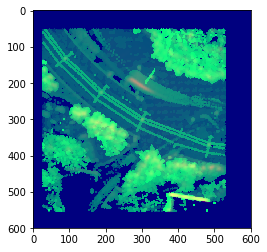

Image saved at:  150_2-160_2_slam slice_no_43.jpeg
44 out of 117 tiles(600, 600, 3)


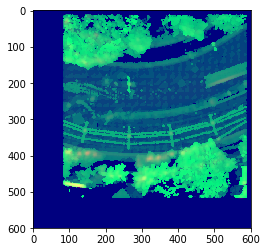

Image saved at:  150_2-160_2_slam slice_no_44.jpeg
45 out of 117 tiles(600, 600, 3)


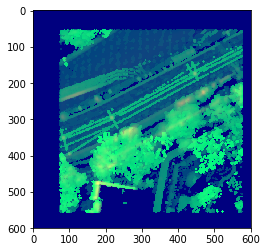

Image saved at:  150_2-160_2_slam slice_no_45.jpeg
46 out of 117 tiles(600, 600, 3)


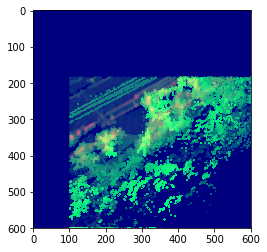

Image saved at:  150_2-160_2_slam slice_no_46.jpeg
47 out of 117 tiles(600, 600, 3)


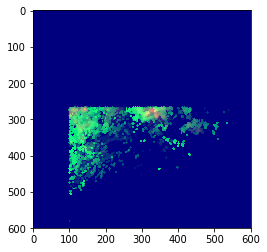

Image saved at:  150_2-160_2_slam slice_no_47.jpeg
48 out of 117 tiles(600, 600, 3)


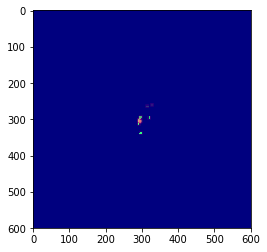

Image saved at:  150_2-160_2_slam slice_no_48.jpeg
54 out of 117 tiles(600, 600, 3)


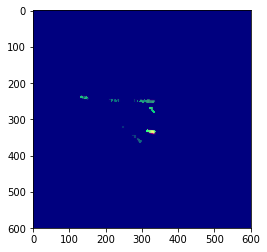

Image saved at:  150_2-160_2_slam slice_no_54.jpeg
55 out of 117 tiles(600, 600, 3)


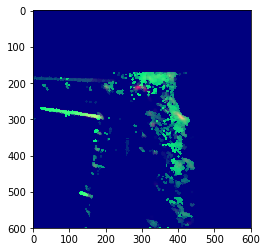

Image saved at:  150_2-160_2_slam slice_no_55.jpeg
56 out of 117 tiles(600, 600, 3)


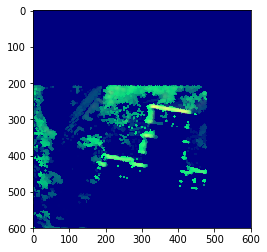

Image saved at:  150_2-160_2_slam slice_no_56.jpeg
57 out of 117 tiles(600, 600, 3)


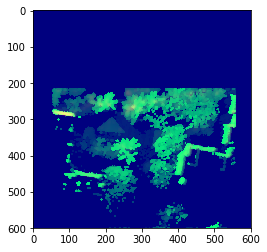

Image saved at:  150_2-160_2_slam slice_no_57.jpeg
58 out of 117 tiles(600, 600, 3)


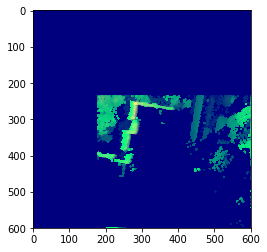

Image saved at:  150_2-160_2_slam slice_no_58.jpeg
59 out of 117 tiles(600, 600, 3)


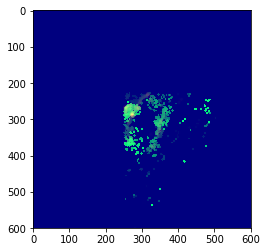

Image saved at:  150_2-160_2_slam slice_no_59.jpeg
67 out of 117 tiles(600, 600, 3)


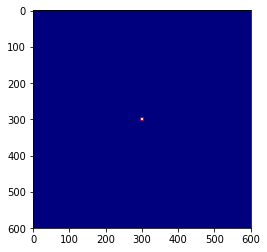

Image saved at:  150_2-160_2_slam slice_no_67.jpeg
68 out of 117 tiles(600, 600, 3)


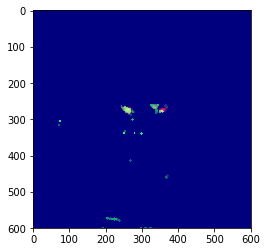

Image saved at:  150_2-160_2_slam slice_no_68.jpeg
69 out of 117 tiles(600, 600, 3)


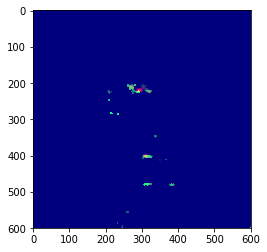

Image saved at:  150_2-160_2_slam slice_no_69.jpeg
70 out of 117 tiles(600, 600, 3)


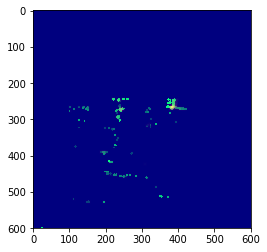

Image saved at:  150_2-160_2_slam slice_no_70.jpeg
71 out of 117 tiles(600, 600, 3)


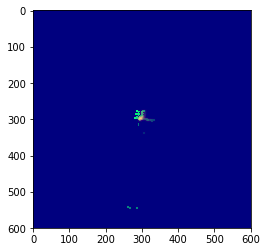

Image saved at:  150_2-160_2_slam slice_no_71.jpeg
81 out of 117 tiles(600, 600, 3)


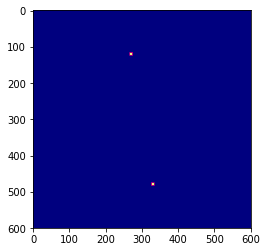

Image saved at:  150_2-160_2_slam slice_no_81.jpeg
82 out of 117 tiles(600, 600, 3)


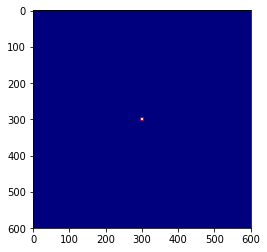

Image saved at:  150_2-160_2_slam slice_no_82.jpeg
83 out of 117 tiles(600, 600, 3)


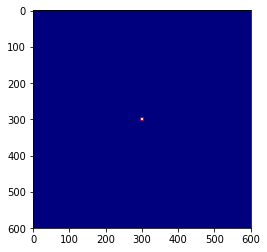

Image saved at:  150_2-160_2_slam slice_no_83.jpeg
94 out of 117 tiles(600, 600, 3)


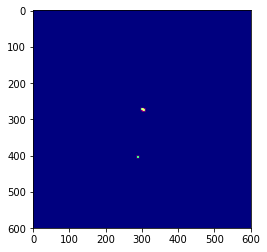

Image saved at:  150_2-160_2_slam slice_no_94.jpeg
95 out of 117 tiles(600, 600, 3)


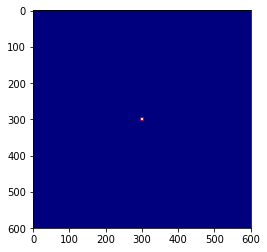

Image saved at:  150_2-160_2_slam slice_no_95.jpeg
107 out of 117 tiles(600, 600, 3)


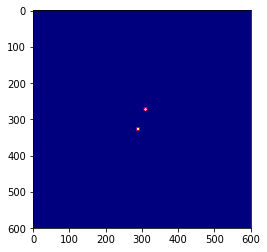

Image saved at:  150_2-160_2_slam slice_no_107.jpeg
117 out of 117 tiles

In [23]:

# PCD file Path
pcd_file_path = "../../data/pcd_files/"

# temporary folder path to store ground and read again
temp = '../../data/temp/'

# Store slice images here
raster_images_path = '../../data/dataset/'

# Making folders if not exists
make_folder_if_not_exists(temp)
make_folder_if_not_exists(raster_images_path)

for i in glob.glob(pcd_file_path + "*.pcd"):
    # PCD file
    pcd_files_path, file_name = i.rsplit("/",1)
    print("Reading File: ", file_name, " From Path: ", pcd_file_path)
    pcd_file = read_pcd(pcd_files_path + "/" + file_name)
    xyz_data = pcd_file['points'][['x','y','z']].values


    # Removing Ground
    xyz_data_gr = ground_removal.removeGround(xyz_data,offset,thresh=2.0,proc_path=temp)
    ground_pts = ground_removal.load_ground_surface(os.path.join(temp,'_ground_surface.ply'))


    counter = 0
    slices = detection_tools.sliding_window_3d(xyz_data, stepSize=stepSize,windowSize=windowSize)

    for (x, y, window) in slices:  # stepsize 100

        # track progress
        counter += 1 
        totalCount = len(range(int(np.min(xyz_data[:, 0])), int(np.max(xyz_data[:, 0])),stepSize)) * \
                     len(range(int(np.min(xyz_data[:, 1])), int(np.max(xyz_data[:, 1])),stepSize))
        sys.stdout.write("\r%d out of %d tiles" % (counter, totalCount))
        sys.stdout.flush()

        if window is not None:

            image, center = rasterMaker._rasterise(window, ground_pts=ground_pts)
            print(image.shape)
            image = np.uint8(image*255)
            plt.imshow(image)
            plt.show()

            image_path = "{} slice_no_{}.jpeg".format(file_name.split(".")[0], counter)
            plt.imsave(raster_images_path + image_path, image)

            print("Image saved at: ",  image_path)